# 第二阶段的数据分析

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import warnings
import time
from collections import Counter
warnings.filterwarnings("ignore")

plt.style.use("fivethirtyeight")
sns.set_style({'font.sans-serif': ['simsun', 'Arial']})
sns.set_style('darkgrid', {'font.sans-serif': ['simhei', 'Arial']})
%matplotlib inline

main_path = r'./data/data_set_phase2/'

In [2]:
profiles = pd.read_csv(main_path+'profiles.csv')
test_plans = pd.read_csv(main_path+'test_plans.csv',parse_dates=['plan_time'])
test_queries = pd.read_csv(main_path+'test_queries.csv',parse_dates=['req_time'])
train_clicks_phase1 = pd.read_csv(main_path+'train_clicks_phase1.csv')
train_clicks_phase2 = pd.read_csv(main_path+'train_clicks_phase2.csv')
train_plans_phase1 = pd.read_csv(main_path+'train_plans_phase1.csv',parse_dates=['plan_time'])
train_plans_phase2 = pd.read_csv(main_path+'train_plans_phase2.csv',parse_dates=['plan_time'])
train_queries_phase1 = pd.read_csv(main_path+'train_queries_phase1.csv',parse_dates=['req_time'])
train_queries_phase2 = pd.read_csv(main_path+'train_queries_phase2.csv',parse_dates=['req_time'])

In [3]:
train_clicks = pd.concat([train_clicks_phase1,train_clicks_phase2],ignore_index=True)
train_plans = pd.concat([train_plans_phase1,train_plans_phase2],ignore_index=True)
train_queries = pd.concat([train_queries_phase1,train_queries_phase2],ignore_index=True)

In [22]:
train_queries.shape

(2000000, 5)

# 用户属性信息分析

In [3]:
profiles.head()

,pid,p0,p1,p2,p3,p4,p5,p6,p7,p8,...,p56,p57,p58,p59,p60,p61,p62,p63,p64,p65
0,20555,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,42213,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,29526,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,117756,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,185606,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0


In [5]:
profiles.isnull().sum()

pid    0
p0     0
p1     0
p2     0
p3     0
p4     0
p5     0
p6     0
p7     0
p8     0
p9     0
p10    0
p11    0
p12    0
p13    0
p14    0
p15    0
p16    0
p17    0
p18    0
p19    0
p20    0
p21    0
p22    0
p23    0
p24    0
p25    0
p26    0
p27    0
p28    0
      ..
p36    0
p37    0
p38    0
p39    0
p40    0
p41    0
p42    0
p43    0
p44    0
p45    0
p46    0
p47    0
p48    0
p49    0
p50    0
p51    0
p52    0
p53    0
p54    0
p55    0
p56    0
p57    0
p58    0
p59    0
p60    0
p61    0
p62    0
p63    0
p64    0
p65    0
Length: 67, dtype: int64

In [7]:
profiles.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119856 entries, 0 to 119855
Data columns (total 67 columns):
pid    119856 non-null int64
p0     119856 non-null float64
p1     119856 non-null float64
p2     119856 non-null float64
p3     119856 non-null float64
p4     119856 non-null float64
p5     119856 non-null float64
p6     119856 non-null float64
p7     119856 non-null float64
p8     119856 non-null float64
p9     119856 non-null float64
p10    119856 non-null float64
p11    119856 non-null float64
p12    119856 non-null float64
p13    119856 non-null float64
p14    119856 non-null float64
p15    119856 non-null float64
p16    119856 non-null float64
p17    119856 non-null float64
p18    119856 non-null float64
p19    119856 non-null float64
p20    119856 non-null float64
p21    119856 non-null float64
p22    119856 non-null float64
p23    119856 non-null float64
p24    119856 non-null float64
p25    119856 non-null float64
p26    119856 non-null float64
p27    119856 non-null 

In [8]:
profiles.shape

(119856, 67)

In [9]:
for feature in profiles.columns:
    uniq_num = len(profiles[feature].unique())
    print("Feature(%s) ----- count(%d)" % (feature, uniq_num))

Feature(pid) ----- count(119856)
Feature(p0) ----- count(2)
Feature(p1) ----- count(2)
Feature(p2) ----- count(2)
Feature(p3) ----- count(2)
Feature(p4) ----- count(2)
Feature(p5) ----- count(2)
Feature(p6) ----- count(2)
Feature(p7) ----- count(2)
Feature(p8) ----- count(2)
Feature(p9) ----- count(2)
Feature(p10) ----- count(2)
Feature(p11) ----- count(2)
Feature(p12) ----- count(2)
Feature(p13) ----- count(2)
Feature(p14) ----- count(2)
Feature(p15) ----- count(2)
Feature(p16) ----- count(2)
Feature(p17) ----- count(2)
Feature(p18) ----- count(2)
Feature(p19) ----- count(2)
Feature(p20) ----- count(2)
Feature(p21) ----- count(2)
Feature(p22) ----- count(2)
Feature(p23) ----- count(2)
Feature(p24) ----- count(2)
Feature(p25) ----- count(2)
Feature(p26) ----- count(2)
Feature(p27) ----- count(2)
Feature(p28) ----- count(2)
Feature(p29) ----- count(2)
Feature(p30) ----- count(2)
Feature(p31) ----- count(2)
Feature(p32) ----- count(2)
Feature(p33) ----- count(2)
Feature(p34) ----- count(

-----------------------------------------    p0   -----------------------------------------
二值比例: 3.355463497946873         为0的数量：  92338         为1的数量：  27518


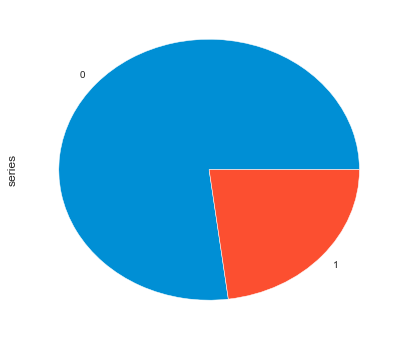

-----------------------------------------    p1   -----------------------------------------
二值比例: 3153.157894736842         为0的数量：  119819         为1的数量：  37


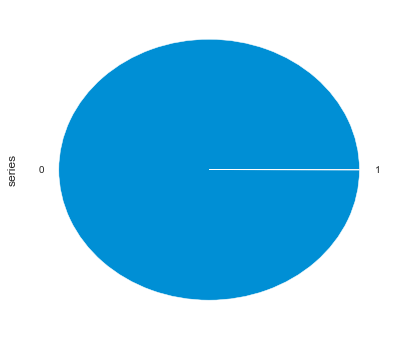

-----------------------------------------    p2   -----------------------------------------
二值比例: 1.7285102895647424         为0的数量：  75929         为1的数量：  43927


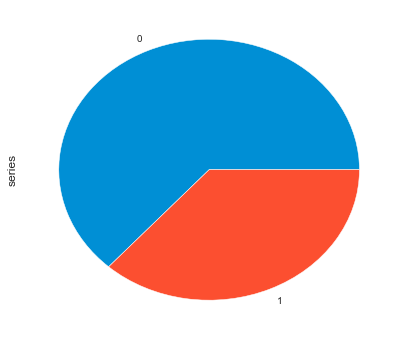

-----------------------------------------    p3   -----------------------------------------
二值比例: 2.907351263243684         为0的数量：  89182         为1的数量：  30674


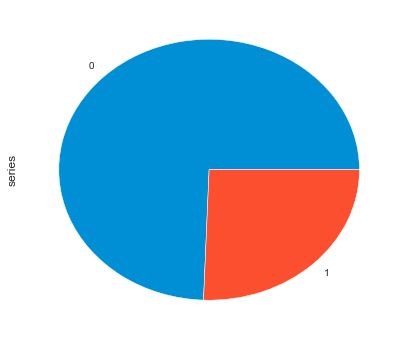

-----------------------------------------    p4   -----------------------------------------
二值比例: 7.665895452244957         为0的数量：  106026         为1的数量：  13830


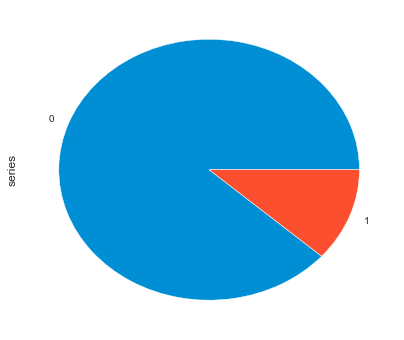

-----------------------------------------    p5   -----------------------------------------
二值比例: 38.93935354881706         为0的数量：  116856         为1的数量：  3000


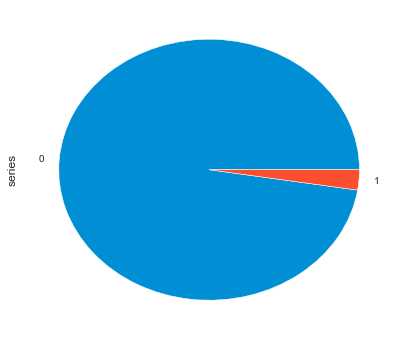

-----------------------------------------    p6   -----------------------------------------
二值比例: 162.96443228454172         为0的数量：  119126         为1的数量：  730


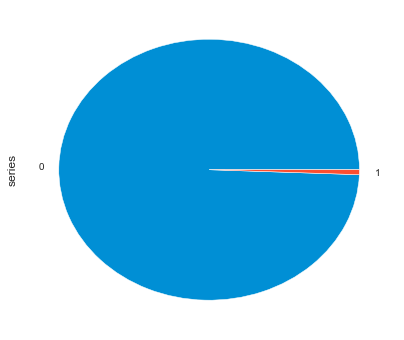

-----------------------------------------    p7   -----------------------------------------
二值比例: 1.295382729762338         为0的数量：  67640         为1的数量：  52216


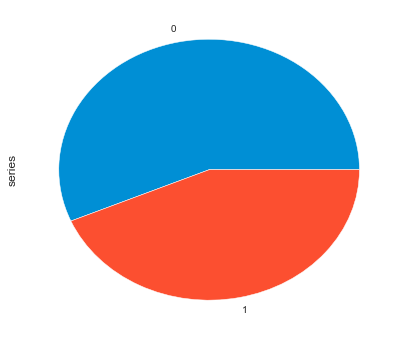

-----------------------------------------    p8   -----------------------------------------
二值比例: 0.7755425524035257         为0的数量：  52352         为1的数量：  67504


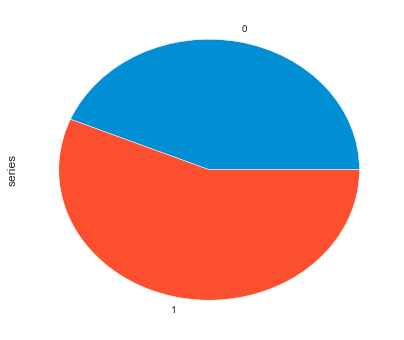

-----------------------------------------    p9   -----------------------------------------
二值比例: 0.9441056251216505         为0的数量：  58205         为1的数量：  61651


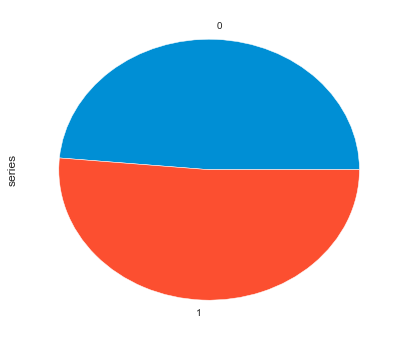

-----------------------------------------    p10   -----------------------------------------
二值比例: 5.802383654937571         为0的数量：  102237         为1的数量：  17619


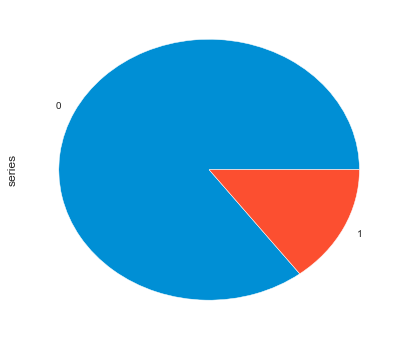

-----------------------------------------    p11   -----------------------------------------
二值比例: 1345.7191011235955         为0的数量：  119768         为1的数量：  88


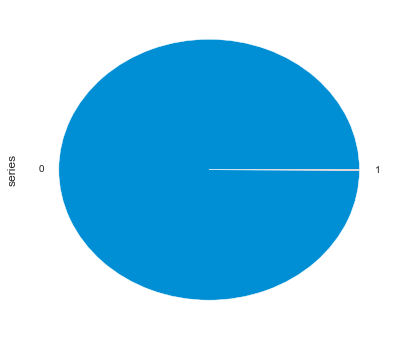

-----------------------------------------    p12   -----------------------------------------
二值比例: 14981.25         为0的数量：  119849         为1的数量：  7


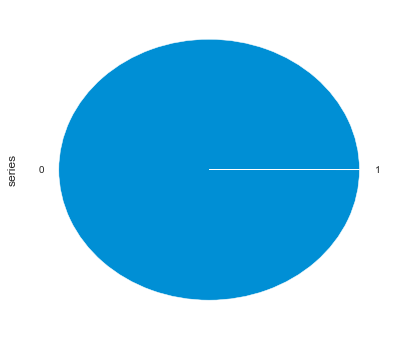

-----------------------------------------    p13   -----------------------------------------
二值比例: 598.29         为0的数量：  119657         为1的数量：  199


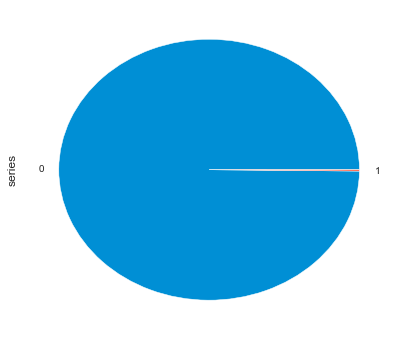

-----------------------------------------    p14   -----------------------------------------
二值比例: 66.29814710836608         为0的数量：  118076         为1的数量：  1780


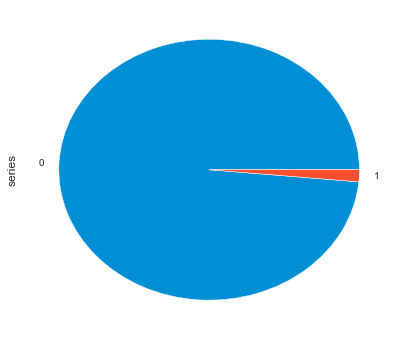

-----------------------------------------    p15   -----------------------------------------
二值比例: 30.458792650918635         为0的数量：  116047         为1的数量：  3809


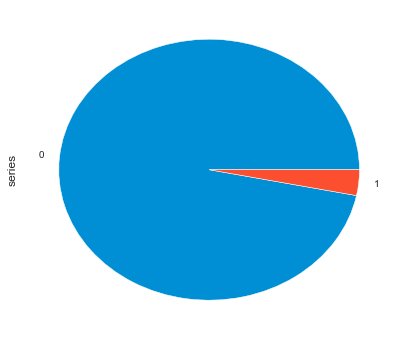

-----------------------------------------    p16   -----------------------------------------
二值比例: 22.649960536700867         为0的数量：  114789         为1的数量：  5067


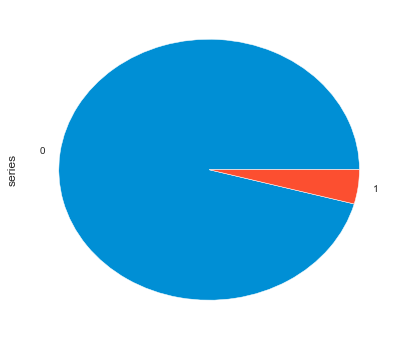

-----------------------------------------    p17   -----------------------------------------
二值比例: 15.883786448795606         为0的数量：  112758         为1的数量：  7098


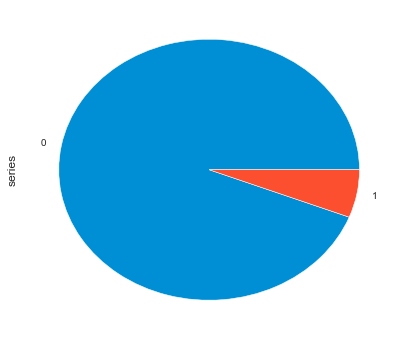

-----------------------------------------    p18   -----------------------------------------
二值比例: 20.353643327988596         为0的数量：  114244         为1的数量：  5612


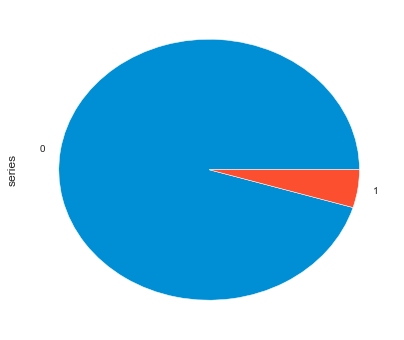

-----------------------------------------    p19   -----------------------------------------
二值比例: 31.578961674368035         为0的数量：  116178         为1的数量：  3678


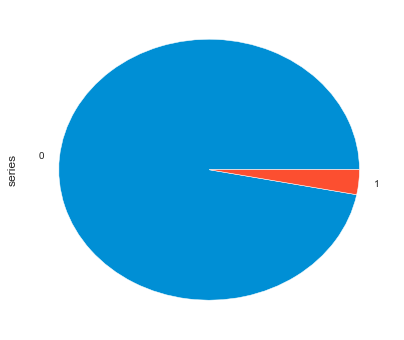

-----------------------------------------    p20   -----------------------------------------
二值比例: 88.6469708302169         为0的数量：  118520         为1的数量：  1336


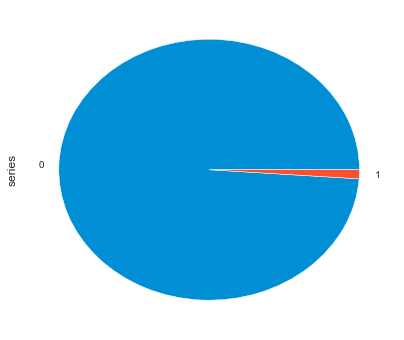

-----------------------------------------    p21   -----------------------------------------
二值比例: 10.551464919043948         为0的数量：  109481         为1的数量：  10375


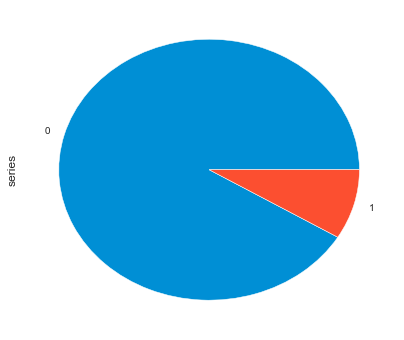

-----------------------------------------    p22   -----------------------------------------
二值比例: 37.4776886035313         为0的数量：  116742         为1的数量：  3114


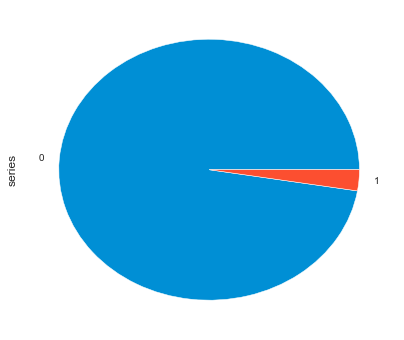

-----------------------------------------    p23   -----------------------------------------
二值比例: 699.9239766081871         为0的数量：  119686         为1的数量：  170


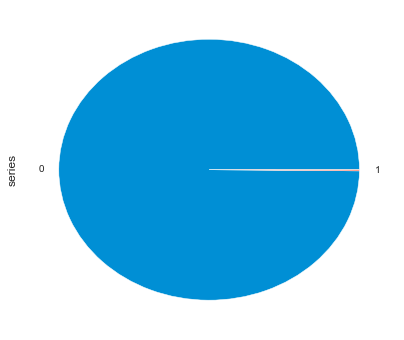

-----------------------------------------    p24   -----------------------------------------
二值比例: 416.62369337979095         为0的数量：  119570         为1的数量：  286


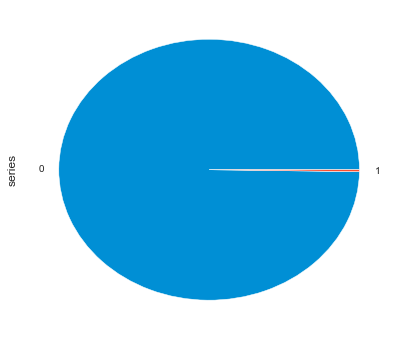

-----------------------------------------    p25   -----------------------------------------
二值比例: 1129.7358490566037         为0的数量：  119751         为1的数量：  105


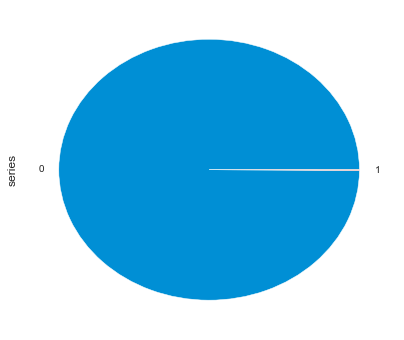

-----------------------------------------    p26   -----------------------------------------
二值比例: 3.9772849964702464         为0的数量：  95776         为1的数量：  24080


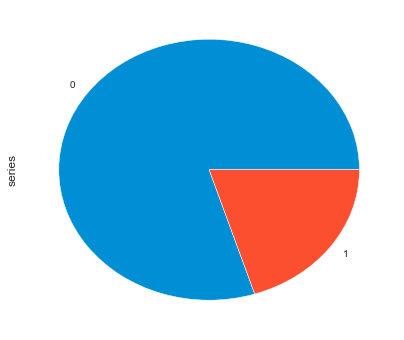

-----------------------------------------    p27   -----------------------------------------
二值比例: 3.1854244508852183         为0的数量：  91220         为1的数量：  28636


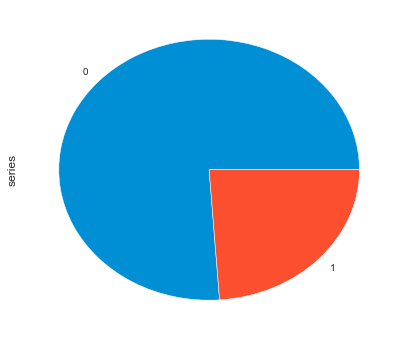

-----------------------------------------    p28   -----------------------------------------
二值比例: 3.1506389167849846         为0的数量：  90980         为1的数量：  28876


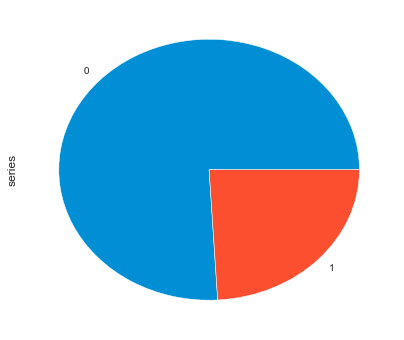

-----------------------------------------    p29   -----------------------------------------
二值比例: 3.091135611154726         为0的数量：  90560         为1的数量：  29296


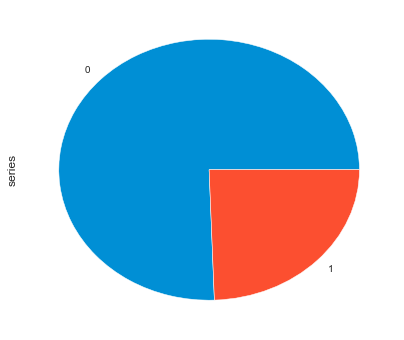

-----------------------------------------    p30   -----------------------------------------
二值比例: 0.43963197847602575         为0的数量：  36601         为1的数量：  83255


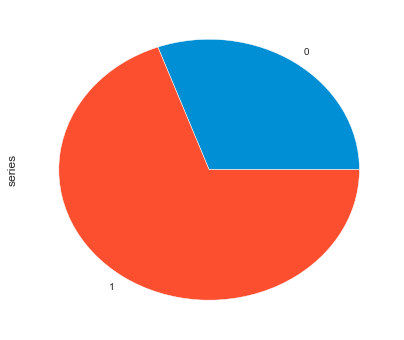

-----------------------------------------    p31   -----------------------------------------
二值比例: 2.389553462854557         为0的数量：  84496         为1的数量：  35360


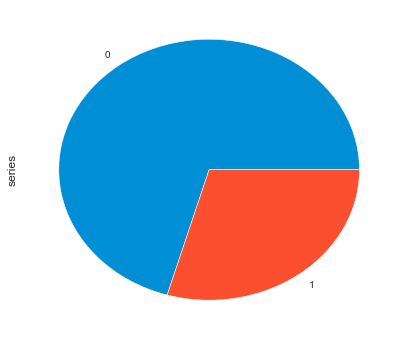

-----------------------------------------    p32   -----------------------------------------
二值比例: 1.6376039786981207         为0的数量：  74415         为1的数量：  45441


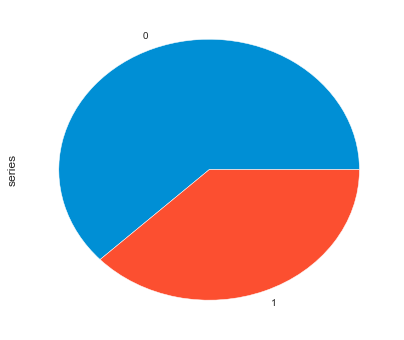

-----------------------------------------    p33   -----------------------------------------
二值比例: 4.488506273468266         为0的数量：  98019         为1的数量：  21837


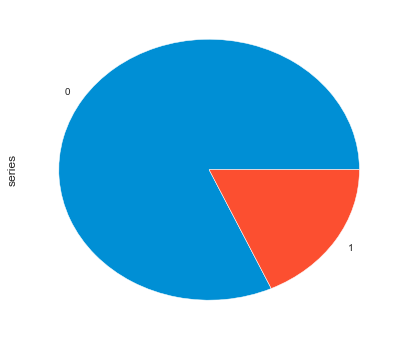

-----------------------------------------    p34   -----------------------------------------
二值比例: 1.3290130773565474         为0的数量：  68394         为1的数量：  51462


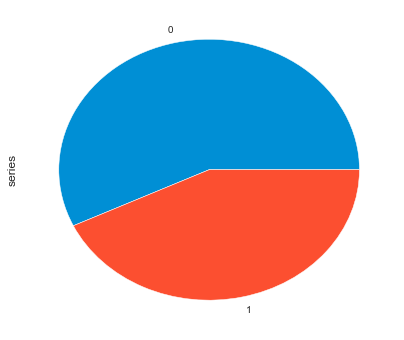

-----------------------------------------    p35   -----------------------------------------
二值比例: 1.8135680751173708         为0的数量：  77257         为1的数量：  42599


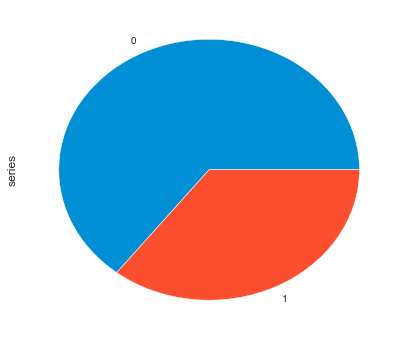

-----------------------------------------    p36   -----------------------------------------
二值比例: 3.4905773481697953         为0的数量：  93166         为1的数量：  26690


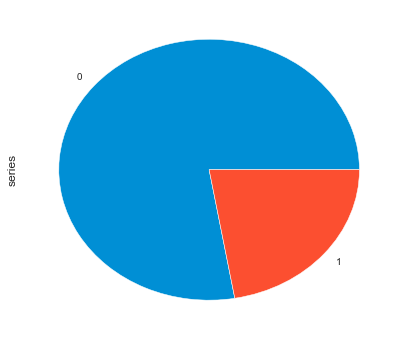

-----------------------------------------    p37   -----------------------------------------
二值比例: 1.4281922975628534         为0的数量：  70496         为1的数量：  49360


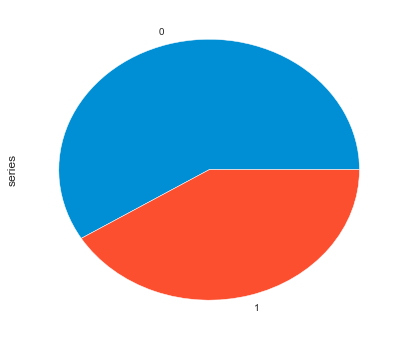

-----------------------------------------    p38   -----------------------------------------
二值比例: 14.162302340290955         为0的数量：  111952         为1的数量：  7904


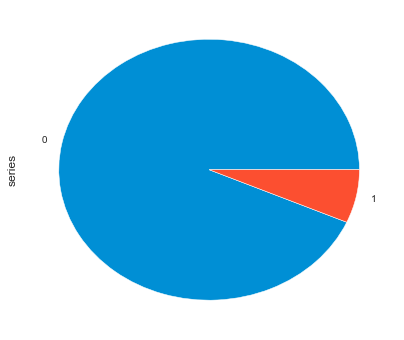

-----------------------------------------    p39   -----------------------------------------
二值比例: 14.243291364619102         为0的数量：  111994         为1的数量：  7862


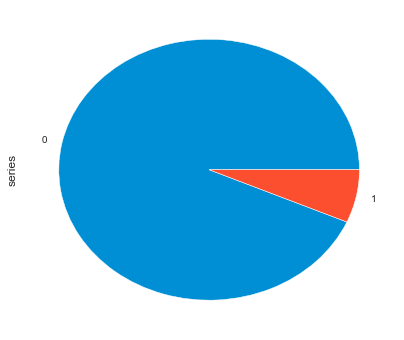

-----------------------------------------    p40   -----------------------------------------
二值比例: 15.396443228454173         为0的数量：  112547         为1的数量：  7309


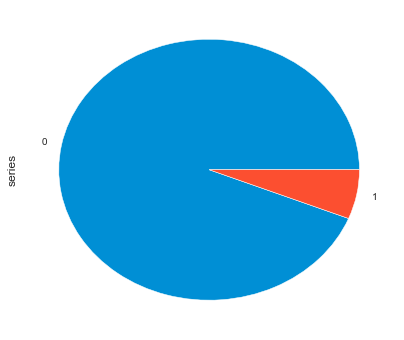

-----------------------------------------    p41   -----------------------------------------
二值比例: 67.64719358533792         为0的数量：  118111         为1的数量：  1745


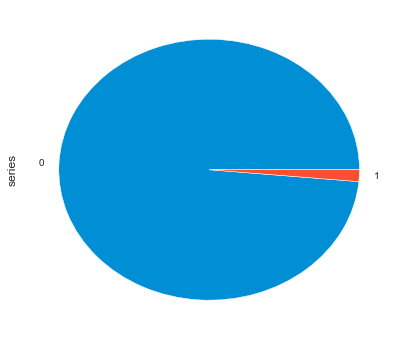

-----------------------------------------    p42   -----------------------------------------
二值比例: 15.21894451962111         为0的数量：  112467         为1的数量：  7389


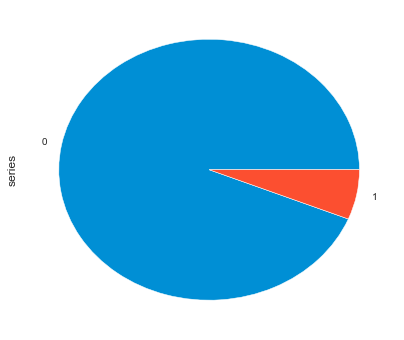

-----------------------------------------    p43   -----------------------------------------
二值比例: 28.689868714391874         为0的数量：  115820         为1的数量：  4036


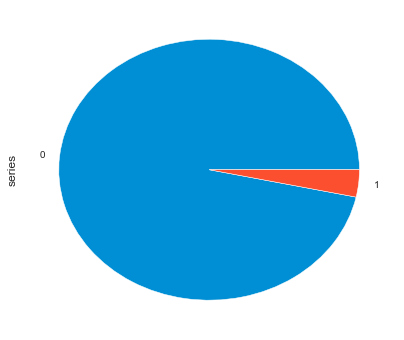

-----------------------------------------    p44   -----------------------------------------
二值比例: 41.89835361488905         为0的数量：  117063         为1的数量：  2793


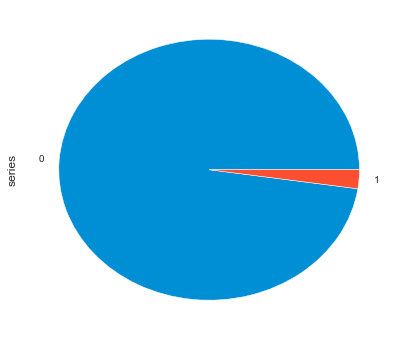

-----------------------------------------    p45   -----------------------------------------
二值比例: 24.425965210012727         为0的数量：  115143         为1的数量：  4713


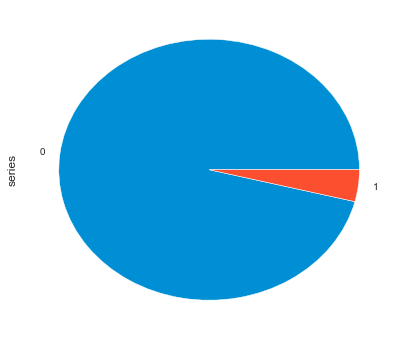

-----------------------------------------    p46   -----------------------------------------
二值比例: 18.896746347941566         为0的数量：  113833         为1的数量：  6023


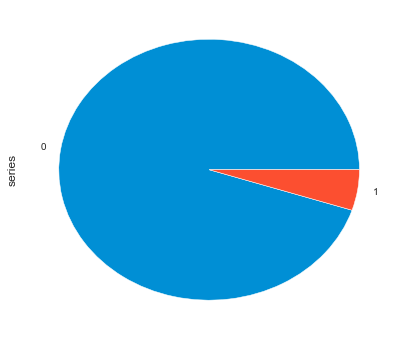

-----------------------------------------    p47   -----------------------------------------
二值比例: 10.529242016160062         为0的数量：  109461         为1的数量：  10395


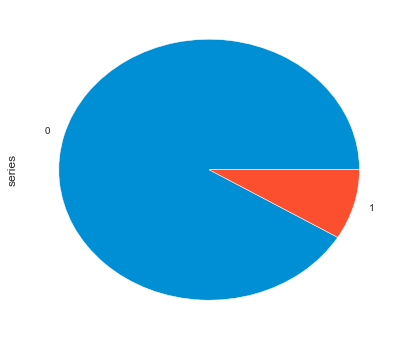

-----------------------------------------    p48   -----------------------------------------
二值比例: 34.210928319623974         为0的数量：  116453         为1的数量：  3403


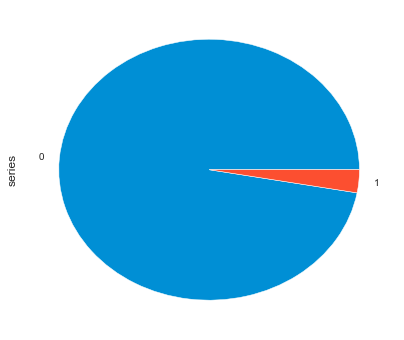

-----------------------------------------    p49   -----------------------------------------
二值比例: 19.100285091396948         为0的数量：  113894         为1的数量：  5962


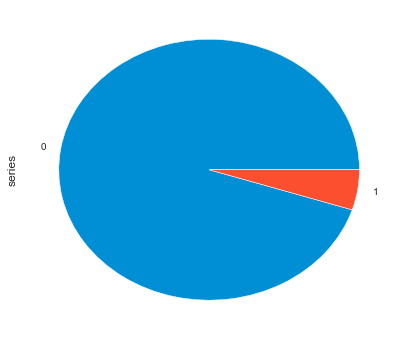

-----------------------------------------    p50   -----------------------------------------
二值比例: 23.48580183861083         为0的数量：  114962         为1的数量：  4894


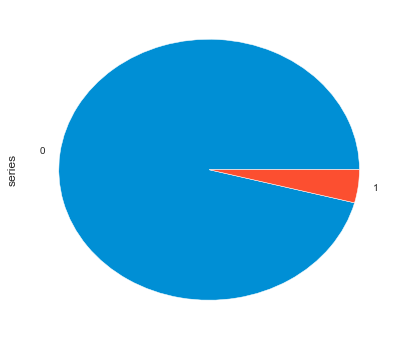

-----------------------------------------    p51   -----------------------------------------
二值比例: 28.25506468147425         为0的数量：  115760         为1的数量：  4096


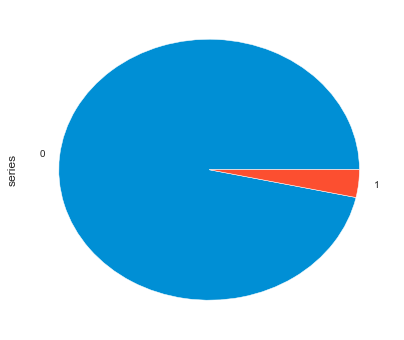

-----------------------------------------    p52   -----------------------------------------
二值比例: 55.2977923907938         为0的数量：  117728         为1的数量：  2128


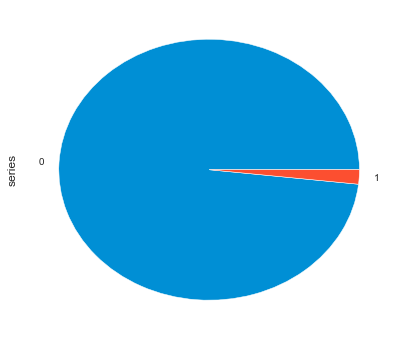

-----------------------------------------    p53   -----------------------------------------
二值比例: 31.202579258463192         为0的数量：  116135         为1的数量：  3721


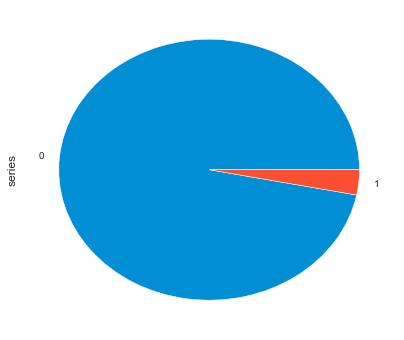

-----------------------------------------    p54   -----------------------------------------
二值比例: 12.669936131386862         为0的数量：  111089         为1的数量：  8767


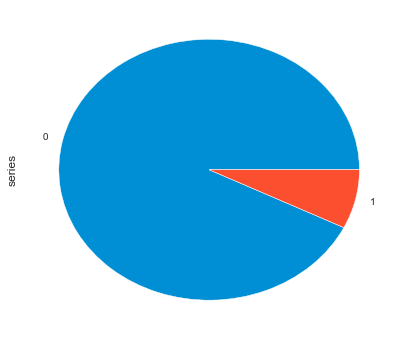

-----------------------------------------    p55   -----------------------------------------
二值比例: 26.043772563176894         为0的数量：  115425         为1的数量：  4431


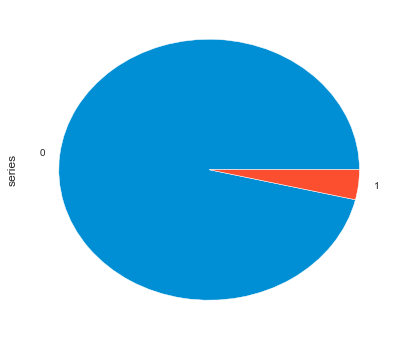

-----------------------------------------    p56   -----------------------------------------
二值比例: 19.411784741144412         为0的数量：  113985         为1的数量：  5871


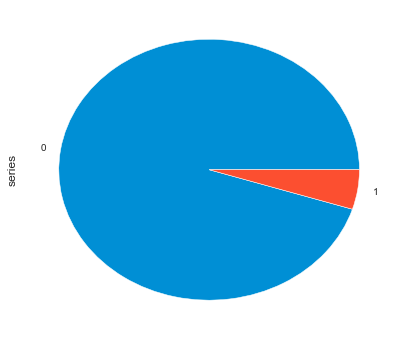

-----------------------------------------    p57   -----------------------------------------
二值比例: 13.719145278153015         为0的数量：  111714         为1的数量：  8142


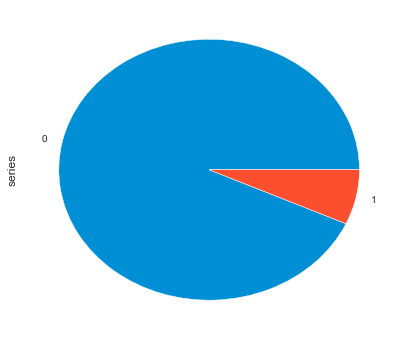

-----------------------------------------    p58   -----------------------------------------
二值比例: 61.62173458725183         为0的数量：  117943         为1的数量：  1913


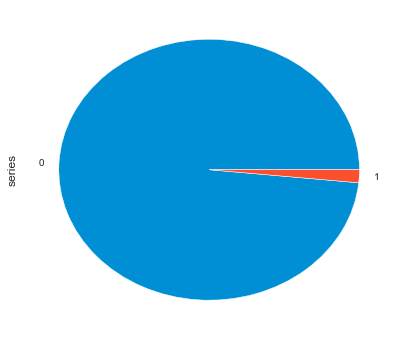

-----------------------------------------    p59   -----------------------------------------
二值比例: 29.328441295546558         为0的数量：  115905         为1的数量：  3951


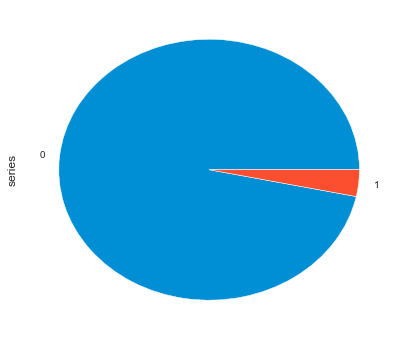

-----------------------------------------    p60   -----------------------------------------
二值比例: 2.151918373787046         为0的数量：  81830         为1的数量：  38026


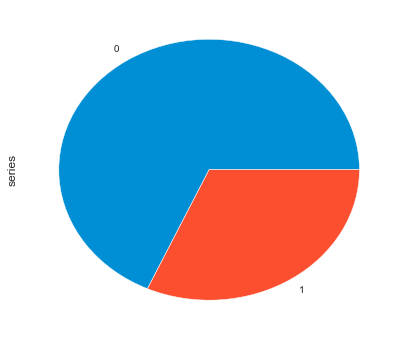

-----------------------------------------    p61   -----------------------------------------
二值比例: 7.7449292280752955         为0的数量：  106151         为1的数量：  13705


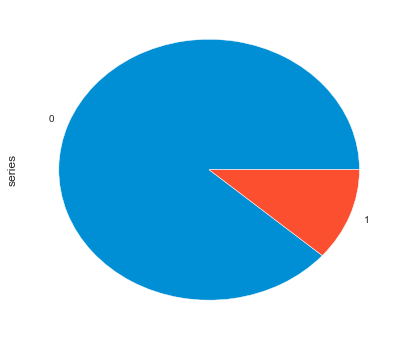

-----------------------------------------    p62   -----------------------------------------
二值比例: 3.2766716620281167         为0的数量：  91831         为1的数量：  28025


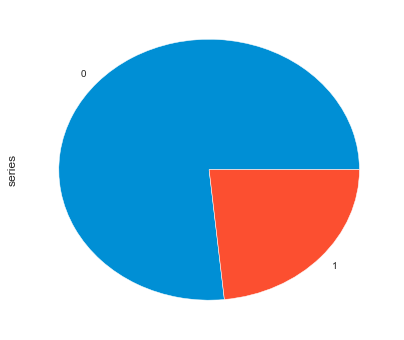

-----------------------------------------    p63   -----------------------------------------
二值比例: 4.081312531795828         为0的数量：  96269         为1的数量：  23587


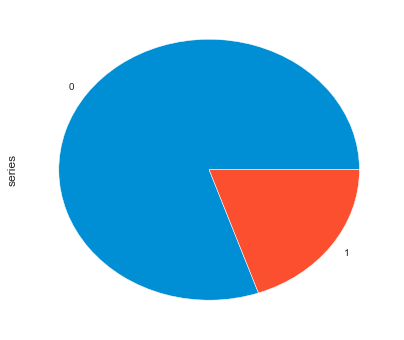

-----------------------------------------    p64   -----------------------------------------
二值比例: 23.351483136936206         为0的数量：  114935         为1的数量：  4921


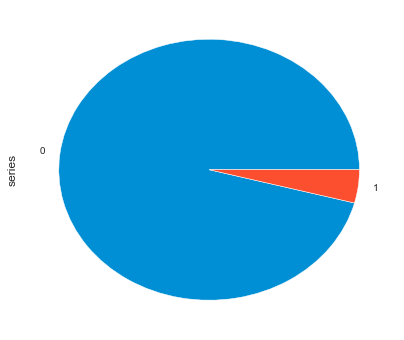

-----------------------------------------    p65   -----------------------------------------
二值比例: 47.116419108791646         为0的数量：  117366         为1的数量：  2490


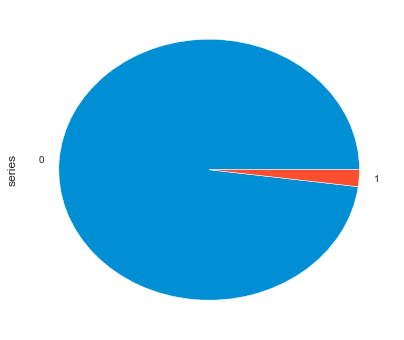

In [10]:
for col in [ 'p' + str(i) for i in range(66)]:
    print('-----------------------------------------    '+col+'   -----------------------------------------')
    print('二值比例:',((len(profiles[profiles[col]==0])+1)/(len(profiles[profiles[col]==1])+1)),end=' ')
    print('        为0的数量： ',(len(profiles[profiles[col]==0])),end=' ')
    print('        为1的数量： ',(len(profiles[profiles[col]==1])))
    
    series = pd.Series([len(profiles[profiles[col]==0]),len(profiles[profiles[col]==1])], index=['0', '1'], name='series')
    series.plot.pie(figsize=(6, 6))
    plt.show()

# 训练集-业务请求表


In [6]:
train_queries.head()

,sid,pid,req_time,o,d
0,419087,22813.0,2018-10-17 10:17:11,"116.34,39.99","116.37,39.86"
1,481938,NaN,2018-10-13 15:50:15,"116.43,39.94","116.46,39.95"
2,441201,34393.0,2018-10-13 16:15:21,"116.28,40.01","116.39,39.99"
3,347266,NaN,2018-10-22 13:26:04,"116.31,39.51","116.32,39.72"
4,206269,NaN,2018-11-08 10:27:23,"116.33,39.89","116.59,39.76"
5,74252,33834.0,2018-11-28 06:25:27,"116.34,39.97","116.45,39.96"
6,67098,22742.0,2018-10-12 16:11:27,"116.39,39.99","116.42,39.95"
7,148016,52267.0,2018-11-22 14:07:50,"116.41,39.92","116.47,39.93"
8,491763,37897.0,2018-10-03 14:28:55,"116.17,39.88","116.23,39.89"
9,438713,27331.0,2018-10-24 21:46:28,"116.27,39.91","116.35,39.92"


In [19]:
train_queries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000000 entries, 0 to 1999999
Data columns (total 5 columns):
sid         int64
pid         float64
req_time    object
o           object
d           object
dtypes: float64(1), int64(1), object(3)
memory usage: 76.3+ MB


In [20]:
for feature in train_queries.columns:
    uniq_num = len(train_queries[feature].unique())
    print("Feature(%s) ----- count(%d)" % (feature, uniq_num))

Feature(sid) ----- count(2000000)
Feature(pid) ----- count(97372)
Feature(req_time) ----- count(1524599)
Feature(o) ----- count(14807)
Feature(d) ----- count(13445)


In [23]:
train_queries[train_queries.isnull().values==True]

,sid,pid,req_time,o,d
1,481938,NaN,2018-10-13 15:50:15,"116.43,39.94","116.46,39.95"
3,347266,NaN,2018-10-22 13:26:04,"116.31,39.51","116.32,39.72"
4,206269,NaN,2018-11-08 10:27:23,"116.33,39.89","116.59,39.76"
15,369117,NaN,2018-10-18 17:29:11,"116.39,39.94","116.34,39.92"
16,250204,NaN,2018-10-24 10:23:08,"116.42,39.90","116.56,40.00"
17,359181,NaN,2018-10-22 14:39:42,"116.31,39.90","116.25,39.89"
20,409170,NaN,2018-10-20 11:59:09,"116.37,40.01","116.18,39.99"
22,26037,NaN,2018-11-13 23:20:52,"116.31,39.94","116.31,39.95"
23,39674,NaN,2018-10-25 22:37:18,"116.34,40.06","116.16,39.72"
24,285908,NaN,2018-11-10 07:08:36,"116.37,39.95","116.39,39.90"


In [25]:
676803/2000000  #包含pid空值的比例

0.3384015

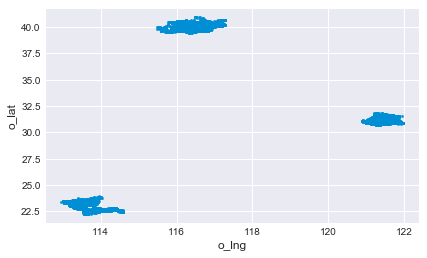

In [6]:
train_queries['o_lng'] = train_queries['o'].apply(lambda x: float(x.split(',')[0]))
train_queries['o_lat'] = train_queries['o'].apply(lambda x: float(x.split(',')[1]))
train_queries['d_lng'] = train_queries['d'].apply(lambda x: float(x.split(',')[0]))
train_queries['d_lat'] = train_queries['d'].apply(lambda x: float(x.split(',')[1])) 



train_queries.plot.scatter(x='o_lng', y='o_lat',marker='.')
plt.show()

看下位置分布图，这应该不是简单的一个城市的，很明显的三个城市的数据，经过反编码，分别是   北京（中间位置）  深圳（左边） 上海（右边）

三个城市可以按照lat度进行分离，估计还可以分别对三个城市进行建模，效果可能更好些。

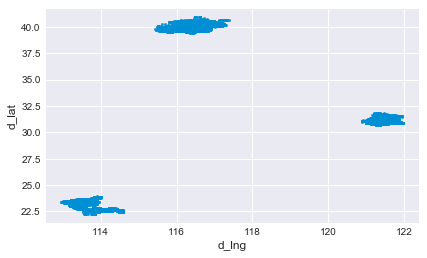

In [7]:
#请求的终点坐标分布
train_queries.plot.scatter(x='d_lng', y='d_lat',marker='.')

plt.show()

In [28]:
train_queries['o'].value_counts()

113.32,23.13    10442
121.48,31.24     9940
121.45,31.25     9142
121.47,31.24     8527
113.25,23.15     8195
113.32,23.12     8137
121.32,31.20     8094
113.32,23.15     8034
113.32,23.14     7928
114.03,22.61     7327
113.26,23.12     7229
113.26,22.99     7108
114.11,22.55     6828
114.06,22.54     6718
113.26,23.13     6676
114.05,22.54     6420
121.50,31.24     6212
116.37,39.86     5993
116.32,39.89     5930
116.42,39.90     5819
113.24,23.12     5816
114.11,22.54     5684
116.41,39.91     5616
113.33,23.14     5585
116.37,39.91     5246
116.40,39.91     5156
113.34,23.17     4968
114.08,22.55     4757
121.48,31.23     4746
121.43,31.20     4539
                ...  
116.90,40.41        1
113.32,22.82        1
113.41,22.78        1
121.03,30.91        1
116.08,39.92        1
113.83,23.85        1
113.79,23.56        1
121.27,30.72        1
121.28,30.82        1
121.52,30.87        1
116.45,40.42        1
113.65,23.62        1
116.91,40.18        1
121.36,30.96        1
116.72,40.

In [29]:
train_queries['o'].value_counts()[:10]

113.32,23.13    10442
121.48,31.24     9940
121.45,31.25     9142
121.47,31.24     8527
113.25,23.15     8195
113.32,23.12     8137
121.32,31.20     8094
113.32,23.15     8034
113.32,23.14     7928
114.03,22.61     7327
Name: o, dtype: int64

<Figure size 5760x5760 with 0 Axes>

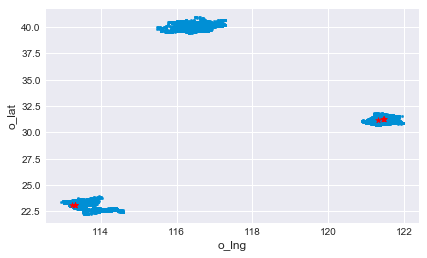

In [30]:
plt.figure(figsize=(80, 80))
train_queries.plot.scatter(x='o_lng', y='o_lat',marker='.')
plt.scatter(113.32,23.13,marker='*',c='red')
plt.scatter(121.48,31.24,marker='*',c='red')
plt.scatter(121.45,31.25,marker='*',c='red')
plt.scatter(121.47,31.24,marker='*',c='red')
plt.scatter(113.25,23.15,marker='*',c='red')
plt.scatter(113.32,23.12,marker='*',c='red')
plt.scatter(121.32,31.20,marker='*',c='red')
plt.scatter(113.32,23.15,marker='*',c='red')
plt.scatter(113.32,23.14,marker='*',c='red')
plt.show()

In [31]:
train_queries['d'].value_counts()[:10]

121.32,31.20    23088
116.32,39.89    16503
113.26,22.99    14951
121.45,31.25    14384
116.37,39.86    13124
114.02,22.61    12832
113.32,23.13    12141
113.25,23.15    11748
113.32,23.15    11571
113.24,23.12    11334
Name: d, dtype: int64

<Figure size 5760x5760 with 0 Axes>

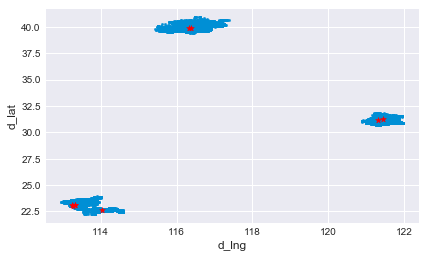

In [32]:
plt.figure(figsize=(80, 80))
train_queries.plot.scatter(x='d_lng', y='d_lat',marker='.')
plt.scatter(121.32,31.20,marker='*',c='red')
plt.scatter(116.32,39.89,marker='*',c='red')
plt.scatter(113.26,22.99,marker='*',c='red')
plt.scatter(121.45,31.25,marker='*',c='red')
plt.scatter(116.37,39.86,marker='*',c='red')
plt.scatter(114.02,22.61,marker='*',c='red')
plt.scatter(113.32,23.13,marker='*',c='red')
plt.scatter(113.25,23.15,marker='*',c='red')
plt.scatter(113.32,23.15,marker='*',c='red')
plt.show()

In [33]:
#打印训练表的时间范围和   测试表的时间范围      时间范围和初赛时的一致

print(np.min(train_queries['req_time']))
print(np.max(train_queries['req_time']))

#顺带打印下测试集的时间范围  最大和最小
print(np.min(test_queries['req_time']))
print(np.max(test_queries['req_time']))

2018-10-01 00:00:02
2018-11-30 23:59:22
2018-12-01 00:00:02
2018-12-07 23:59:36


In [47]:
#对 pid的 请求情况分布的统计
pid_list_count=list(train_queries.groupby(by=['pid']).size())
pid_list_count

[3,
 1,
 31,
 7,
 4,
 1,
 380,
 2,
 1,
 3,
 1,
 17,
 10,
 2,
 7,
 4,
 2,
 5,
 2,
 3,
 1,
 29,
 16,
 10,
 232,
 8,
 1,
 17,
 3,
 1,
 4,
 2,
 3,
 4,
 1,
 23,
 3,
 38,
 1,
 6,
 1,
 71,
 59,
 2,
 1,
 11,
 22,
 30,
 1,
 1,
 1,
 1,
 2,
 1,
 4,
 1,
 3,
 1,
 6,
 6,
 2,
 7,
 36,
 1,
 4,
 13,
 1,
 8,
 1,
 1,
 17,
 51,
 8,
 9,
 4,
 46,
 1,
 6,
 54,
 4,
 6,
 16,
 19,
 9,
 1,
 3,
 11,
 3,
 2,
 16,
 22,
 1,
 135,
 3,
 5,
 13,
 2,
 1,
 2,
 1,
 2,
 5,
 28,
 24,
 3,
 4,
 1,
 75,
 1,
 65,
 3,
 1,
 5,
 1,
 16,
 23,
 16,
 3,
 11,
 5,
 2,
 32,
 129,
 2,
 1,
 11,
 1,
 28,
 1,
 32,
 1,
 2,
 2,
 25,
 11,
 3,
 1,
 22,
 2,
 1,
 60,
 1,
 18,
 21,
 14,
 2,
 2,
 1,
 3,
 52,
 1,
 1,
 85,
 1,
 8,
 5,
 81,
 2,
 5,
 8,
 1,
 96,
 1,
 2,
 1,
 9,
 15,
 6,
 4,
 3,
 7,
 13,
 1,
 9,
 31,
 1,
 3,
 5,
 3,
 18,
 19,
 6,
 1,
 2,
 1,
 2,
 6,
 1,
 3,
 56,
 8,
 11,
 1,
 10,
 27,
 5,
 8,
 6,
 571,
 5,
 13,
 2,
 1,
 27,
 34,
 2,
 1,
 3,
 2,
 11,
 2,
 12,
 36,
 3,
 42,
 4,
 2,
 9,
 1,
 12,
 37,
 6,
 4,
 26,
 3,
 1,
 4,
 1,
 1,
 6,
 1

In [49]:
pid_list_count.sort(reverse=True)
pid_list_count

[22503,
 18588,
 13858,
 10314,
 8544,
 7997,
 7313,
 6828,
 6541,
 5809,
 5716,
 5382,
 4704,
 4622,
 4205,
 3814,
 3538,
 3516,
 3508,
 3382,
 3379,
 3258,
 3233,
 3195,
 3151,
 3144,
 2916,
 2881,
 2818,
 2737,
 2610,
 2601,
 2509,
 2508,
 2442,
 2430,
 2347,
 2344,
 2260,
 2243,
 2214,
 2186,
 2107,
 1970,
 1868,
 1803,
 1792,
 1768,
 1761,
 1751,
 1733,
 1709,
 1683,
 1678,
 1664,
 1662,
 1646,
 1628,
 1548,
 1462,
 1429,
 1412,
 1390,
 1380,
 1374,
 1370,
 1360,
 1357,
 1356,
 1341,
 1341,
 1340,
 1333,
 1317,
 1313,
 1311,
 1296,
 1279,
 1243,
 1214,
 1201,
 1199,
 1172,
 1167,
 1155,
 1116,
 1106,
 1101,
 1096,
 1096,
 1092,
 1089,
 1081,
 1070,
 1047,
 1039,
 1039,
 1022,
 1018,
 1015,
 1011,
 1009,
 996,
 988,
 955,
 950,
 948,
 948,
 945,
 941,
 938,
 929,
 922,
 909,
 906,
 899,
 894,
 891,
 885,
 883,
 870,
 869,
 864,
 864,
 864,
 856,
 855,
 855,
 850,
 842,
 832,
 832,
 830,
 830,
 826,
 822,
 821,
 820,
 818,
 817,
 810,
 802,
 796,
 796,
 766,
 762,
 759,
 758,
 746,


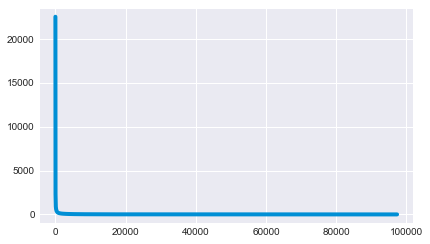

In [50]:
plt.plot(pid_list_count)

可以发现 基本和之前是同分布的， 就是存在少量请求特别大的人

In [55]:
#展示 不同  小时 选择不同模式的分布图
train_queries['req_time_weekday']=train_queries.apply(lambda row:row['req_time'].dayofweek,axis=1)
train_queries['req_time_day']=train_queries.apply(lambda row:row['req_time'].day,axis=1)
train_queries['req_time_hour']=train_queries.apply(lambda row:row['req_time'].hour,axis=1)

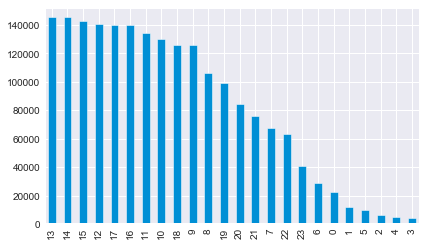

In [56]:
train_queries['req_time_hour'].value_counts().plot.bar()
plt.show()

可以看到  不同时刻的请求次数 是分阶段的   下午和早上是高峰期

看下不同城市分别观察下的分布情况，  现在数据分析必须要分城市观察了，里面有不少的规则和特征可以使用

# 训练集-plans表

In [34]:
print(train_plans.head())

      sid            plan_time  \
0  149233  2018-10-01 13:02:01   
1  337156  2018-11-23 10:48:25   
2  398930  2018-11-08 12:23:06   
3  196610  2018-11-27 12:11:59   
4  302267  2018-10-18 17:22:19   

                                               plans  
0  [{"distance": 2100, "price": 300, "eta": 1064,...  
1  [{"distance": 8887, "price": 400, "eta": 1631,...  
2  [{"distance": 8471, "price": 2300, "eta": 1284...  
3  [{"distance": 32405, "price": 2500, "eta": 477...  
4  [{"distance": 38511, "price": 700, "eta": 4715...  


In [35]:
train_plans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1938572 entries, 0 to 1938571
Data columns (total 3 columns):
sid          int64
plan_time    object
plans        object
dtypes: int64(1), object(2)
memory usage: 44.4+ MB


In [36]:
print(train_plans[train_plans['plans']=='[]'])

Empty DataFrame
Columns: [sid, plan_time, plans]
Index: []


每次session都会有plan请求，而且不为空       

In [38]:
import json 
train_plans['plans_json'] = train_plans['plans'].fillna('[]').apply(lambda x: json.loads(x))
print(train_plans['plans_json'])

0          [{'distance': 2100, 'price': 300, 'eta': 1064,...
1          [{'distance': 8887, 'price': 400, 'eta': 1631,...
2          [{'distance': 8471, 'price': 2300, 'eta': 1284...
3          [{'distance': 32405, 'price': 2500, 'eta': 477...
4          [{'distance': 38511, 'price': 700, 'eta': 4715...
5          [{'distance': 37442, 'price': 1000, 'eta': 580...
6          [{'distance': 11379, 'price': 400, 'eta': 2159...
7          [{'distance': 34492, 'price': 700, 'eta': 4542...
8          [{'distance': 25318, 'price': 600, 'eta': 3187...
9          [{'distance': 27621, 'price': 8900, 'eta': 273...
10         [{'distance': 73655, 'price': '', 'eta': 8336,...
11         [{'distance': 24808, 'price': 600, 'eta': 2941...
12         [{'distance': 34686, 'price': 800, 'eta': 6305...
13         [{'distance': 1323, 'price': '', 'eta': 400, '...
14         [{'distance': 11034, 'price': 400, 'eta': 2785...
15         [{'distance': 12944, 'price': 400, 'eta': 2607...
16         [{'distance':

In [39]:
#对每个plan数据进行详细展示
for index,plan in enumerate(train_plans['plans_json'].values):
    one_plan_describe='本次plan内的数据：'
    for tem_dist in plan:
        one_plan_describe=one_plan_describe+'\n   distance:'+str(tem_dist['distance'])+'   price:'+str(tem_dist['price'])+'   eta:'+str(tem_dist['eta'])+'   transport_mode:'+str(tem_dist['transport_mode'])+'   '
    print(one_plan_describe)    

本次plan内的数据：
   distance:2100   price:300   eta:1064   transport_mode:2   
   distance:2577   price:   eta:461   transport_mode:3   
   distance:2577   price:1300   eta:461   transport_mode:4   
   distance:1720   price:   eta:518   transport_mode:6   
   distance:1645   price:   eta:1438   transport_mode:5   
   distance:1729   price:200   eta:1482   transport_mode:1   
本次plan内的数据：
   distance:8887   price:400   eta:1631   transport_mode:2   
   distance:1   price:2800   eta:180   transport_mode:4   
   distance:8603   price:   eta:2598   transport_mode:6   
本次plan内的数据：
   distance:8471   price:2300   eta:1284   transport_mode:4   
   distance:8471   price:   eta:984   transport_mode:3   
   distance:8458   price:   eta:2559   transport_mode:6   
   distance:21395   price:600   eta:5279   transport_mode:7   
   distance:17719   price:600   eta:5918   transport_mode:1   
本次plan内的数据：
   distance:32405   price:2500   eta:4776   transport_mode:10   
   distance:33500   price:   eta:3824   

本次plan内的数据：
   distance:35966   price:1900   eta:4588   transport_mode:10   
   distance:31538   price:   eta:4122   transport_mode:3   
   distance:31538   price:10500   eta:4422   transport_mode:4   
   distance:35734   price:700   eta:4985   transport_mode:9   
   distance:35683   price:600   eta:5683   transport_mode:2   
   distance:35770   price:800   eta:7758   transport_mode:1   
本次plan内的数据：
   distance:23996   price:500   eta:4374   transport_mode:2   
   distance:23057   price:   eta:3517   transport_mode:3   
   distance:23057   price:7400   eta:3817   transport_mode:4   
   distance:20823   price:500   eta:3935   transport_mode:9   
   distance:20454   price:500   eta:5363   transport_mode:1   
本次plan内的数据：
   distance:410   price:   eta:350   transport_mode:5   
   distance:479   price:   eta:144   transport_mode:6   
   distance:1344   price:   eta:522   transport_mode:3   
本次plan内的数据：
   distance:3435   price:300   eta:1033   transport_mode:2   
   distance:3970   price: 

   distance:1923   price:200   eta:1556   transport_mode:1   
本次plan内的数据：
   distance:2364   price:200   eta:1402   transport_mode:1   
   distance:2203   price:   eta:376   transport_mode:3   
   distance:2203   price:1300   eta:616   transport_mode:4   
   distance:2378   price:   eta:716   transport_mode:6   
   distance:2354   price:   eta:2016   transport_mode:5   
   distance:2980   price:400   eta:2080   transport_mode:1   
本次plan内的数据：
   distance:17411   price:1700   eta:5084   transport_mode:10   
   distance:17610   price:   eta:2956   transport_mode:3   
   distance:17610   price:6000   eta:3136   transport_mode:4   
   distance:16861   price:700   eta:5193   transport_mode:7   
   distance:17187   price:600   eta:5854   transport_mode:1   
本次plan内的数据：
   distance:10852   price:400   eta:2187   transport_mode:2   
   distance:10164   price:   eta:1731   transport_mode:3   
   distance:10164   price:2900   eta:1911   transport_mode:4   
   distance:10665   price:1700   eta:20

本次plan内的数据：
   distance:3494   price:300   eta:1030   transport_mode:2   
   distance:1   price:   eta:1   transport_mode:3   
   distance:1   price:1700   eta:1   transport_mode:4   
   distance:3141   price:   eta:2879   transport_mode:5   
本次plan内的数据：
   distance:19763   price:500   eta:3959   transport_mode:2   
   distance:16653   price:   eta:2675   transport_mode:3   
   distance:16653   price:5200   eta:2975   transport_mode:4   
   distance:17308   price:400   eta:5858   transport_mode:1   
本次plan内的数据：
   distance:26443   price:   eta:4061   transport_mode:3   
   distance:26443   price:7900   eta:4121   transport_mode:4   
   distance:24619   price:700   eta:6460   transport_mode:11   
   distance:24610   price:700   eta:6642   transport_mode:7   
   distance:31257   price:800   eta:8644   transport_mode:1   
本次plan内的数据：
   distance:30469   price:800   eta:4905   transport_mode:7   
   distance:30655   price:600   eta:4441   transport_mode:9   
   distance:26717   price:   et

   distance:41819   price:3200   eta:5224   transport_mode:7   
本次plan内的数据：
   distance:18491   price:500   eta:3637   transport_mode:2   
   distance:16591   price:   eta:2455   transport_mode:3   
   distance:16591   price:4700   eta:2455   transport_mode:4   
   distance:18127   price:2200   eta:3110   transport_mode:10   
   distance:24895   price:700   eta:5051   transport_mode:7   
本次plan内的数据：
   distance:457   price:   eta:391   transport_mode:5   
   distance:437   price:   eta:130   transport_mode:6   
   distance:964   price:   eta:333   transport_mode:3   
本次plan内的数据：
   distance:1862   price:   eta:562   transport_mode:6   
   distance:10701   price:   eta:1563   transport_mode:3   
   distance:1862   price:   eta:1596   transport_mode:5   
   distance:10701   price:3200   eta:1683   transport_mode:4   
本次plan内的数据：
   distance:50042   price:   eta:6327   transport_mode:3   
   distance:50042   price:18300   eta:6447   transport_mode:4   
   distance:52761   price:1100   eta

本次plan内的数据：
   distance:17416   price:700   eta:4587   transport_mode:7   
   distance:18257   price:   eta:2668   transport_mode:3   
   distance:18257   price:4600   eta:2968   transport_mode:4   
   distance:17440   price:2400   eta:3455   transport_mode:10   
   distance:16104   price:400   eta:5437   transport_mode:1   
本次plan内的数据：
   distance:12103   price:600   eta:2957   transport_mode:7   
   distance:7266   price:   eta:1235   transport_mode:3   
   distance:7266   price:2400   eta:1355   transport_mode:4   
   distance:11792   price:400   eta:2199   transport_mode:9   
   distance:10711   price:300   eta:4058   transport_mode:1   
本次plan内的数据：
   distance:1619   price:   eta:488   transport_mode:6   
   distance:3185   price:   eta:563   transport_mode:3   
   distance:3185   price:1300   eta:683   transport_mode:4   
   distance:1625   price:200   eta:1478   transport_mode:1   
   distance:1620   price:200   eta:1501   transport_mode:1   
   distance:1619   price:   eta:1504

   distance:2320   price:1300   eta:725   transport_mode:4   
本次plan内的数据：
   distance:8928   price:400   eta:1945   transport_mode:2   
   distance:11105   price:   eta:1653   transport_mode:3   
   distance:11105   price:2900   eta:1893   transport_mode:4   
   distance:10414   price:600   eta:2692   transport_mode:7   
本次plan内的数据：
   distance:38176   price:   eta:2797   transport_mode:3   
   distance:38176   price:12600   eta:2977   transport_mode:4   
   distance:45870   price:4800   eta:5760   transport_mode:10   
   distance:47398   price:900   eta:6211   transport_mode:7   
   distance:39520   price:900   eta:7033   transport_mode:11   
   distance:49344   price:900   eta:7502   transport_mode:7   
本次plan内的数据：
   distance:28352   price:600   eta:4781   transport_mode:2   
   distance:29732   price:   eta:3259   transport_mode:3   
   distance:29732   price:10900   eta:3379   transport_mode:4   
   distance:28345   price:600   eta:4041   transport_mode:9   
   distance:29172   pr

本次plan内的数据：
   distance:18636   price:500   eta:2677   transport_mode:2   
   distance:19362   price:   eta:2674   transport_mode:3   
   distance:19362   price:5100   eta:2794   transport_mode:4   
   distance:17961   price:700   eta:3518   transport_mode:7   
本次plan内的数据：
   distance:9708   price:400   eta:1889   transport_mode:2   
   distance:10261   price:   eta:1410   transport_mode:3   
   distance:10261   price:3800   eta:1590   transport_mode:4   
   distance:9696   price:200   eta:2729   transport_mode:1   
   distance:9724   price:   eta:2939   transport_mode:6   
本次plan内的数据：
   distance:15645   price:400   eta:3455   transport_mode:2   
   distance:11179   price:   eta:2487   transport_mode:3   
   distance:11179   price:3800   eta:2727   transport_mode:4   
   distance:12275   price:1700   eta:2850   transport_mode:10   
   distance:14546   price:600   eta:3788   transport_mode:11   
   distance:11021   price:300   eta:3896   transport_mode:1   
本次plan内的数据：
   distance:8196

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




本次plan内的数据：
   distance:18429   price:700   eta:3839   transport_mode:7   
   distance:18060   price:   eta:2006   transport_mode:3   
   distance:18060   price:4400   eta:2246   transport_mode:4   
   distance:19257   price:2300   eta:2884   transport_mode:10   
   distance:15846   price:400   eta:4249   transport_mode:1   
本次plan内的数据：
   distance:14084   price:500   eta:2953   transport_mode:2   
   distance:13238   price:   eta:1948   transport_mode:3   
   distance:13238   price:4000   eta:2188   transport_mode:4   
   distance:14227   price:500   eta:2726   transport_mode:9   
   distance:15838   price:700   eta:3538   transport_mode:7   
本次plan内的数据：
   distance:14038   price:300   eta:3560   transport_mode:1   
   distance:12196   price:   eta:1378   transport_mode:3   
   distance:12196   price:3200   eta:1618   transport_mode:4   
   distance:14676   price:400   eta:3178   transport_mode:9   
   distance:16227   price:700   eta:4464   transport_mode:7   
本次plan内的数据：
   distanc

本次plan内的数据：
   distance:15018   price:500   eta:2450   transport_mode:2   
   distance:15367   price:   eta:2306   transport_mode:3   
   distance:15367   price:4100   eta:2366   transport_mode:4   
   distance:15511   price:500   eta:2590   transport_mode:9   
本次plan内的数据：
   distance:4610   price:200   eta:4115   transport_mode:1   
   distance:7048   price:2200   eta:980   transport_mode:4   
   distance:4664   price:   eta:1409   transport_mode:6   
   distance:4380   price:   eta:3918   transport_mode:5   
本次plan内的数据：
   distance:10107   price:400   eta:1846   transport_mode:9   
   distance:9554   price:   eta:1650   transport_mode:3   
   distance:9554   price:2900   eta:1770   transport_mode:4   
   distance:10106   price:400   eta:2022   transport_mode:2   
   distance:9720   price:   eta:2940   transport_mode:6   
本次plan内的数据：
   distance:12043   price:1700   eta:2458   transport_mode:10   
   distance:12569   price:   eta:2025   transport_mode:3   
   distance:12569   price:38

   distance:16761   price:300   eta:4478   transport_mode:1   
本次plan内的数据：
   distance:6502   price:300   eta:1989   transport_mode:2   
   distance:5862   price:   eta:1768   transport_mode:6   
   distance:7101   price:300   eta:1831   transport_mode:9   
   distance:6330   price:   eta:2255   transport_mode:3   
   distance:6330   price:3200   eta:2495   transport_mode:4   
   distance:6967   price:400   eta:4138   transport_mode:1   
本次plan内的数据：
   distance:20613   price:500   eta:3224   transport_mode:2   
   distance:22688   price:   eta:3455   transport_mode:3   
   distance:22688   price:7000   eta:3755   transport_mode:4   
本次plan内的数据：
   distance:561   price:   eta:539   transport_mode:5   
   distance:1081   price:   eta:486   transport_mode:3   
本次plan内的数据：
   distance:45932   price:1000   eta:9179   transport_mode:7   
   distance:39157   price:   eta:3160   transport_mode:3   
   distance:39157   price:12400   eta:3340   transport_mode:4   
   distance:37638   price:900  

本次plan内的数据：
   distance:22656   price:500   eta:3352   transport_mode:2   
   distance:21855   price:   eta:3208   transport_mode:3   
   distance:22717   price:500   eta:3237   transport_mode:9   
   distance:21855   price:7700   eta:3508   transport_mode:4   
   distance:20607   price:600   eta:4516   transport_mode:1   
本次plan内的数据：
   distance:33012   price:600   eta:4471   transport_mode:9   
   distance:28711   price:   eta:3457   transport_mode:3   
   distance:28711   price:9000   eta:3697   transport_mode:4   
   distance:32789   price:1900   eta:3935   transport_mode:10   
   distance:32868   price:800   eta:4653   transport_mode:7   
   distance:32949   price:800   eta:5475   transport_mode:7   
本次plan内的数据：
   distance:393   price:   eta:336   transport_mode:5   
   distance:395   price:   eta:79   transport_mode:3   
   distance:394   price:   eta:119   transport_mode:6   
本次plan内的数据：
   distance:51894   price:700   eta:5790   transport_mode:2   
   distance:55124   price:  

   distance:22605   price:7800   eta:4849   transport_mode:4   
本次plan内的数据：
   distance:107294   price:   eta:4923   transport_mode:3   
   distance:110566   price:3100   eta:12315   transport_mode:1   
   distance:117348   price:3100   eta:14044   transport_mode:1   
本次plan内的数据：
   distance:24697   price:   eta:3404   transport_mode:3   
   distance:24697   price:9800   eta:3704   transport_mode:4   
   distance:26346   price:1400   eta:6171   transport_mode:7   
   distance:25366   price:1300   eta:7258   transport_mode:1   
本次plan内的数据：
   distance:3404   price:300   eta:915   transport_mode:2   
   distance:4325   price:   eta:869   transport_mode:3   
   distance:4325   price:1800   eta:1169   transport_mode:4   
   distance:2767   price:   eta:2468   transport_mode:5   
本次plan内的数据：
   distance:29523   price:8600   eta:2613   transport_mode:4   
   distance:29523   price:   eta:2373   transport_mode:3   
   distance:40542   price:900   eta:7132   transport_mode:7   
   distance:289

本次plan内的数据：
   distance:10197   price:400   eta:2389   transport_mode:2   
   distance:7864   price:400   eta:2485   transport_mode:2   
   distance:4823   price:   eta:4381   transport_mode:5   
本次plan内的数据：
   distance:2316   price:200   eta:1235   transport_mode:1   
   distance:2994   price:   eta:643   transport_mode:3   
   distance:2311   price:   eta:698   transport_mode:6   
   distance:3437   price:300   eta:1736   transport_mode:2   
   distance:2262   price:   eta:2057   transport_mode:5   
本次plan内的数据：
   distance:30170   price:800   eta:5953   transport_mode:7   
   distance:26770   price:   eta:4246   transport_mode:3   
   distance:26770   price:8300   eta:4246   transport_mode:4   
   distance:27380   price:800   eta:8551   transport_mode:1   
本次plan内的数据：
   distance:862   price:   eta:737   transport_mode:5   
   distance:1449   price:   eta:213   transport_mode:3   
   distance:1432   price:   eta:431   transport_mode:6   
   distance:2158   price:200   eta:1453   tran

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



本次plan内的数据：
   distance:20113   price:500   eta:4065   transport_mode:1   
   distance:22729   price:   eta:2508   transport_mode:3   
   distance:22729   price:5600   eta:2808   transport_mode:4   
   distance:19803   price:700   eta:4429   transport_mode:7   
本次plan内的数据：
   distance:19170   price:700   eta:4120   transport_mode:7   
   distance:16675   price:   eta:2504   transport_mode:3   
   distance:16675   price:5600   eta:2624   transport_mode:4   
   distance:16083   price:500   eta:5335   transport_mode:1   
本次plan内的数据：
   distance:10142   price:400   eta:2762   transport_mode:9   
   distance:8780   price:   eta:1439   transport_mode:3   
   distance:8780   price:2400   eta:1559   transport_mode:4   
   distance:7783   price:   eta:2353   transport_mode:6   
   distance:9381   price:200   eta:3209   transport_mode:1   
   distance:9777   price:400   eta:3473   transport_mode:2   
本次plan内的数据：
   distance:10661   price:600   eta:3118   transport_mode:7   
   distance:10064   p

   distance:56220   price:3200   eta:8891   transport_mode:1   
本次plan内的数据：
   distance:4186   price:300   eta:1495   transport_mode:2   
   distance:6422   price:   eta:1112   transport_mode:3   
   distance:6422   price:1700   eta:1232   transport_mode:4   
   distance:4465   price:   eta:1347   transport_mode:6   
   distance:4416   price:200   eta:1729   transport_mode:1   
   distance:3557   price:   eta:3117   transport_mode:5   
本次plan内的数据：
   distance:2646   price:300   eta:1023   transport_mode:2   
   distance:1695   price:   eta:511   transport_mode:6   
   distance:3594   price:   eta:729   transport_mode:3   
   distance:3594   price:1300   eta:729   transport_mode:4   
   distance:1654   price:200   eta:1113   transport_mode:1   
   distance:1891   price:   eta:1708   transport_mode:5   
本次plan内的数据：
   distance:17922   price:500   eta:3490   transport_mode:2   
   distance:15557   price:   eta:2720   transport_mode:3   
   distance:15557   price:5300   eta:2840   transpor

本次plan内的数据：
   distance:17647   price:500   eta:3708   transport_mode:2   
   distance:16406   price:   eta:2198   transport_mode:3   
   distance:16406   price:4300   eta:2378   transport_mode:4   
   distance:19645   price:1800   eta:3612   transport_mode:10   
   distance:15670   price:400   eta:5236   transport_mode:1   
本次plan内的数据：
   distance:4230   price:300   eta:1483   transport_mode:2   
   distance:3587   price:   eta:797   transport_mode:3   
   distance:3587   price:1600   eta:977   transport_mode:4   
   distance:3609   price:   eta:1089   transport_mode:6   
   distance:4230   price:300   eta:1309   transport_mode:9   
   distance:4150   price:200   eta:2011   transport_mode:1   
   distance:2961   price:   eta:2613   transport_mode:5   
本次plan内的数据：
   distance:8883   price:400   eta:2296   transport_mode:9   
   distance:9445   price:   eta:1242   transport_mode:3   
   distance:9445   price:2400   eta:1422   transport_mode:4   
   distance:7715   price:   eta:2326   tr

   distance:3370   price:   eta:3046   transport_mode:5   
本次plan内的数据：
   distance:1402   price:200   eta:774   transport_mode:1   
   distance:1266   price:   eta:215   transport_mode:3   
   distance:1266   price:1300   eta:335   transport_mode:4   
   distance:1264   price:   eta:382   transport_mode:6   
   distance:1264   price:   eta:1163   transport_mode:5   
本次plan内的数据：
   distance:18396   price:500   eta:2683   transport_mode:9   
   distance:17662   price:   eta:1796   transport_mode:3   
   distance:17662   price:4500   eta:2096   transport_mode:4   
   distance:19304   price:1800   eta:2774   transport_mode:10   
   distance:18437   price:500   eta:2885   transport_mode:2   
   distance:17706   price:600   eta:3426   transport_mode:1   
本次plan内的数据：
   distance:656   price:   eta:581   transport_mode:5   
   distance:637   price:   eta:127   transport_mode:3   
   distance:657   price:   eta:198   transport_mode:6   
   distance:678   price:200   eta:594   transport_mode:1  

本次plan内的数据：
   distance:24755   price:600   eta:3833   transport_mode:9   
   distance:24710   price:   eta:3559   transport_mode:3   
   distance:24710   price:6800   eta:3739   transport_mode:4   
   distance:24710   price:600   eta:3965   transport_mode:2   
本次plan内的数据：
   distance:14572   price:500   eta:1710   transport_mode:2   
   distance:1   price:   eta:1   transport_mode:3   
   distance:1   price:5000   eta:240   transport_mode:4   
本次plan内的数据：
   distance:15612   price:500   eta:2139   transport_mode:2   
   distance:14995   price:   eta:1877   transport_mode:3   
   distance:14995   price:4000   eta:1997   transport_mode:4   
本次plan内的数据：
   distance:13200   price:1700   eta:2727   transport_mode:10   
   distance:15197   price:   eta:2562   transport_mode:3   
   distance:15197   price:4100   eta:2682   transport_mode:4   
   distance:12955   price:400   eta:3231   transport_mode:9   
   distance:12890   price:600   eta:3924   transport_mode:7   
   distance:13858   price

   distance:813   price:200   eta:795   transport_mode:1   
本次plan内的数据：
   distance:55317   price:1300   eta:7624   transport_mode:1   
   distance:35387   price:   eta:2566   transport_mode:3   
   distance:35387   price:8600   eta:2686   transport_mode:4   
本次plan内的数据：
   distance:2751   price:2000   eta:1963   transport_mode:1   
   distance:2569   price:   eta:774   transport_mode:6   
   distance:4252   price:   eta:1429   transport_mode:3   
   distance:4252   price:1400   eta:1609   transport_mode:4   
   distance:3411   price:200   eta:2032   transport_mode:1   
   distance:2566   price:   eta:2286   transport_mode:5   
本次plan内的数据：
   distance:8255   price:400   eta:1481   transport_mode:2   
   distance:8276   price:   eta:1955   transport_mode:3   
   distance:8276   price:3100   eta:2135   transport_mode:4   
本次plan内的数据：
   distance:34391   price:600   eta:4825   transport_mode:9   
   distance:33425   price:   eta:3820   transport_mode:3   
   distance:33425   price:10600  

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




本次plan内的数据：
   distance:18670   price:700   eta:3830   transport_mode:7   
   distance:16208   price:   eta:1808   transport_mode:3   
   distance:16208   price:4100   eta:2048   transport_mode:4   
   distance:18711   price:1800   eta:2817   transport_mode:10   
   distance:18315   price:700   eta:4055   transport_mode:7   
本次plan内的数据：
   distance:747   price:   eta:659   transport_mode:5   
   distance:1196   price:   eta:355   transport_mode:6   
   distance:1366   price:   eta:463   transport_mode:3   
   distance:898   price:200   eta:1066   transport_mode:1   
本次plan内的数据：
   distance:14117   price:   eta:1271   transport_mode:3   
   distance:14117   price:5200   eta:1511   transport_mode:4   
   distance:17826   price:500   eta:3055   transport_mode:9   
   distance:17791   price:500   eta:3392   transport_mode:2   
   distance:17617   price:600   eta:4883   transport_mode:1   
本次plan内的数据：
   distance:2691   price:200   eta:1473   transport_mode:1   
   distance:2484   price:  

本次plan内的数据：
   distance:15973   price:   eta:1508   transport_mode:3   
   distance:15973   price:5600   eta:1748   transport_mode:4   
   distance:30992   price:2800   eta:5401   transport_mode:7   
   distance:19506   price:700   eta:5502   transport_mode:1   
本次plan内的数据：
   distance:23307   price:600   eta:3218   transport_mode:2   
   distance:21581   price:   eta:4048   transport_mode:3   
   distance:21581   price:8600   eta:4348   transport_mode:4   
   distance:22594   price:700   eta:5951   transport_mode:11   
本次plan内的数据：
   distance:30001   price:800   eta:6222   transport_mode:7   
   distance:27308   price:   eta:2400   transport_mode:3   
   distance:27308   price:8400   eta:2520   transport_mode:4   
   distance:29140   price:600   eta:4710   transport_mode:9   
   distance:28920   price:800   eta:6714   transport_mode:7   
本次plan内的数据：
   distance:6166   price:2000   eta:1193   transport_mode:4   
   distance:6166   price:   eta:1073   transport_mode:3   
   distance:592

   distance:34427   price:4500   eta:4661   transport_mode:10   
本次plan内的数据：
   distance:5405   price:200   eta:2850   transport_mode:1   
   distance:7063   price:   eta:947   transport_mode:3   
   distance:7063   price:1900   eta:1127   transport_mode:4   
   distance:5418   price:   eta:1635   transport_mode:6   
   distance:6778   price:400   eta:3305   transport_mode:1   
本次plan内的数据：
   distance:13695   price:700   eta:3983   transport_mode:7   
   distance:12322   price:   eta:2250   transport_mode:3   
   distance:12322   price:5300   eta:2370   transport_mode:4   
   distance:14369   price:400   eta:5316   transport_mode:1   
本次plan内的数据：
   distance:24420   price:700   eta:4134   transport_mode:7   
   distance:24163   price:   eta:2640   transport_mode:3   
   distance:24163   price:6900   eta:2880   transport_mode:4   
   distance:25282   price:600   eta:3972   transport_mode:9   
   distance:27218   price:700   eta:5424   transport_mode:7   
本次plan内的数据：
   distance:7271   p

本次plan内的数据：
   distance:18228   price:500   eta:2844   transport_mode:2   
   distance:19863   price:   eta:2861   transport_mode:3   
   distance:18046   price:500   eta:3097   transport_mode:9   
   distance:19863   price:6800   eta:3161   transport_mode:4   
本次plan内的数据：
   distance:33361   price:2700   eta:4791   transport_mode:7   
   distance:17612   price:   eta:2123   transport_mode:3   
本次plan内的数据：
   distance:19453   price:500   eta:3508   transport_mode:2   
   distance:18013   price:   eta:2391   transport_mode:3   
   distance:18013   price:7000   eta:2511   transport_mode:4   
   distance:20122   price:2300   eta:2847   transport_mode:10   
   distance:19453   price:500   eta:3287   transport_mode:9   
本次plan内的数据：
   distance:44299   price:700   eta:5331   transport_mode:9   
   distance:37231   price:   eta:3330   transport_mode:3   
   distance:37231   price:9600   eta:3450   transport_mode:4   
   distance:38475   price:3500   eta:4809   transport_mode:10   
   distance

   distance:18748   price:500   eta:3575   transport_mode:9   
本次plan内的数据：
   distance:7393   price:400   eta:1849   transport_mode:2   
   distance:7410   price:400   eta:1543   transport_mode:9   
   distance:6093   price:   eta:1843   transport_mode:6   
   distance:7579   price:   eta:2161   transport_mode:3   
   distance:7579   price:3900   eta:2161   transport_mode:4   
本次plan内的数据：
   distance:28334   price:800   eta:6832   transport_mode:1   
   distance:36747   price:   eta:2579   transport_mode:3   
   distance:36747   price:8100   eta:2819   transport_mode:4   
   distance:28648   price:700   eta:6837   transport_mode:1   
本次plan内的数据：
   distance:37517   price:800   eta:4459   transport_mode:1   
   distance:36253   price:   eta:2458   transport_mode:3   
   distance:36253   price:10700   eta:2698   transport_mode:4   
   distance:49091   price:700   eta:5653   transport_mode:9   
   distance:38821   price:900   eta:6094   transport_mode:1   
本次plan内的数据：
   distance:7483   p

本次plan内的数据：
   distance:5788   price:200   eta:1740   transport_mode:1   
   distance:5848   price:   eta:827   transport_mode:3   
   distance:5848   price:1700   eta:1007   transport_mode:4   
   distance:5778   price:   eta:1749   transport_mode:6   
   distance:8844   price:400   eta:1834   transport_mode:9   
   distance:8505   price:400   eta:1893   transport_mode:2   
本次plan内的数据：
   distance:29636   price:600   eta:4504   transport_mode:2   
   distance:28947   price:   eta:2780   transport_mode:3   
   distance:28947   price:10100   eta:2960   transport_mode:4   
   distance:38568   price:2200   eta:4922   transport_mode:10   
   distance:29637   price:700   eta:5623   transport_mode:1   
本次plan内的数据：
   distance:25710   price:700   eta:6211   transport_mode:7   
   distance:1   price:   eta:1   transport_mode:3   
   distance:1   price:8400   eta:240   transport_mode:4   
   distance:25337   price:2600   eta:4040   transport_mode:10   
   distance:26320   price:700   eta:6853  

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



跟之前同样，有很多价钱为的地点。

In [40]:
#统计每个在推荐中，有重复的mode的数量      构建计数统计，可以在后面直接被使用   好快
mode_1_dup=0
mode_2_dup=0
mode_3_dup=0
mode_4_dup=0
mode_5_dup=0
mode_6_dup=0
mode_7_dup=0
mode_8_dup=0
mode_9_dup=0
mode_10_dup=0
mode_11_dup=0
#统计price、eta、distance的最大最小值    
price_list=[]
eta_list=[]
distance_list=[]


for index,plan in enumerate(train_plans['plans_json'].values):
    one_plan_mode=''
    already_have_mode=[]
    for tem_dist in plan:
        price_list.append(tem_dist['price'])
        eta_list.append(tem_dist['eta'])
        distance_list.append(tem_dist['distance'])
        if tem_dist['transport_mode'] in already_have_mode:
            #是重复的模式
            if tem_dist['transport_mode']==1:
                mode_1_dup+=1
            if tem_dist['transport_mode']==2:
                mode_2_dup+=1
            if tem_dist['transport_mode']==3:
                mode_3_dup+=1
            if tem_dist['transport_mode']==4:
                mode_4_dup+=1
            if tem_dist['transport_mode']==5:
                mode_5_dup+=1
            if tem_dist['transport_mode']==6:
                mode_6_dup+=1
            if tem_dist['transport_mode']==7:
                mode_7_dup+=1
            if tem_dist['transport_mode']==8:
                mode_8_dup+=1
            if tem_dist['transport_mode']==9:
                mode_9_dup+=1
            if tem_dist['transport_mode']==10:
                mode_10_dup+=1
            if tem_dist['transport_mode']==11:
                mode_11_dup+=1
                
        else:
            already_have_mode.append(tem_dist['transport_mode'])

In [41]:
#统计  price、eta、distance、transport_mode的缺失数量
price_null_num=0
eta_null_num=0
distance_null_num=0

def all_list(arr):
    result = {}
    for i in set(arr):
        result[i] = arr.count(i)
    return result

print('print中为空值数量：',all_list(price_list)[''])

print中为空值数量： 3783825


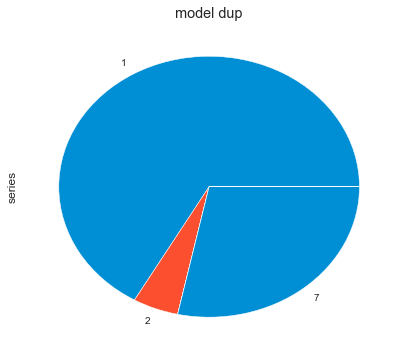

In [42]:
#展示不同mode产生重复的比例
series = pd.Series([mode_1_dup,mode_2_dup,mode_3_dup,mode_4_dup,mode_5_dup,mode_6_dup,mode_7_dup,mode_8_dup,mode_9_dup,mode_10_dup,mode_11_dup],index=['1','2', '3','4', '5','6', '7','8', '9','10', '11',], name='series')
series.plot.pie(figsize=(6, 6))
plt.title('model dup')
plt.show()

# 训练集 - model点击表

In [57]:
train_clicks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1675183 entries, 0 to 1675182
Data columns (total 3 columns):
sid           1675183 non-null int64
click_time    1675183 non-null object
click_mode    1675183 non-null int64
dtypes: int64(2), object(1)
memory usage: 38.3+ MB


In [58]:
train_clicks.head()

,sid,click_time,click_mode
0,175043,2018-10-14 10:35:07,7
1,414568,2018-10-20 04:18:48,2
2,314669,2018-10-26 16:53:04,2
3,117837,2018-10-03 18:48:02,7
4,474691,2018-11-01 15:59:01,2


In [72]:
train_clicks['click_mode'].value_counts()

2     466176
7     286659
1     274329
9     205343
5     187332
3      83194
10     51678
4      41587
6      40162
11     31830
8       6893
Name: click_mode, dtype: int64

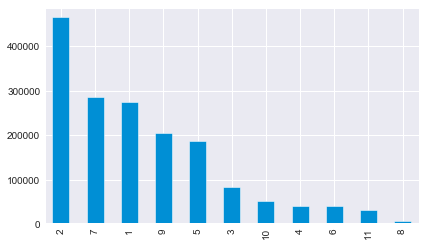

In [69]:
train_clicks['click_mode'].value_counts().plot.bar()

In [73]:
train_clicks.isnull().sum()

sid           0
click_time    0
click_mode    0
dtype: int64

In [75]:
train_clicks[train_clicks.isnull().values==True]

,sid,click_time,click_mode


单独看  在train_clicks中是没有空值的，也就是所有有点击事件的都会在其中显示， 而有些pid是没有被点击的，这样的pid事件默认的clock_mode是0，果然复赛和初赛时完全同分布的。  只不过把城市扩展成三个城市了、

# 测试集 - 请求表

In [76]:
test_queries.head()

,sid,pid,req_time,o,d
0,2068451,NaN,2018-12-05 14:00:11,"116.15,39.73","116.38,39.96"
1,2293651,22317.0,2018-12-03 12:38:59,"113.93,22.53","113.97,22.55"
2,2121308,NaN,2018-12-03 17:08:58,"121.53,31.23","121.52,31.24"
3,2086760,57077.0,2018-12-07 17:51:36,"116.36,39.83","116.41,39.84"
4,2103547,53986.0,2018-12-03 11:30:59,"121.40,31.20","121.40,31.21"


In [78]:
test_queries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 304916 entries, 0 to 304915
Data columns (total 5 columns):
sid         304916 non-null int64
pid         200223 non-null float64
req_time    304916 non-null datetime64[ns]
o           304916 non-null object
d           304916 non-null object
dtypes: datetime64[ns](1), float64(1), int64(1), object(2)
memory usage: 11.6+ MB


同样只有pid有空值，大约三分之一 也是

In [83]:
for feature in test_queries.columns:
    uniq_num = len(test_queries[feature].unique())
    print("Feature(%s) ----- count(%d)" % (feature, uniq_num))

Feature(sid) ----- count(304916)
Feature(pid) ----- count(30965)
Feature(req_time) ----- count(215375)
Feature(o) ----- count(9566)
Feature(d) ----- count(8629)


In [85]:
print(np.min(test_queries['req_time']))  #也是未来7点的预测
print(np.max(test_queries['req_time']))

2018-12-01 00:00:02
2018-12-07 23:59:36


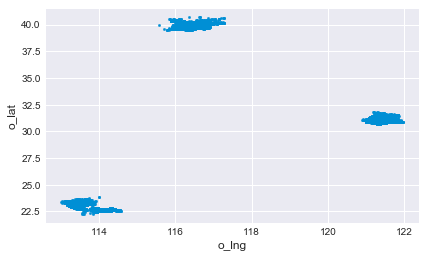

In [33]:
test_queries['o_lng'] = test_queries['o'].apply(lambda x: float(x.split(',')[0]))
test_queries['o_lat'] = test_queries['o'].apply(lambda x: float(x.split(',')[1]))
test_queries['d_lng'] = test_queries['d'].apply(lambda x: float(x.split(',')[0]))
test_queries['d_lat'] = test_queries['d'].apply(lambda x: float(x.split(',')[1])) 



test_queries.plot.scatter(x='o_lng', y='o_lat',marker='.')
plt.show()

In [34]:
test_queries['o'].value_counts()[:10]

113.32,23.13    1559
121.48,31.24    1515
121.45,31.25    1409
121.32,31.20    1384
121.47,31.24    1319
113.32,23.12    1268
113.32,23.14    1146
116.32,39.89    1133
113.32,23.15    1096
116.37,39.86    1059
Name: o, dtype: int64

<Figure size 5760x5760 with 0 Axes>

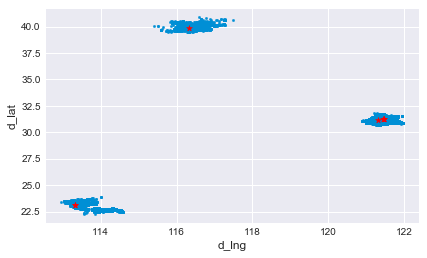

In [35]:
plt.figure(figsize=(80, 80))
test_queries.plot.scatter(x='d_lng', y='d_lat',marker='.')
plt.scatter(113.32,23.13,marker='*',c='red')
plt.scatter(121.48,31.24,marker='*',c='red')
plt.scatter(121.45,31.25,marker='*',c='red')
plt.scatter(121.32,31.20,marker='*',c='red')
plt.scatter(121.47,31.24,marker='*',c='red')
plt.scatter(113.32,23.14,marker='*',c='red')
plt.scatter(116.32,39.89,marker='*',c='red')

plt.show()

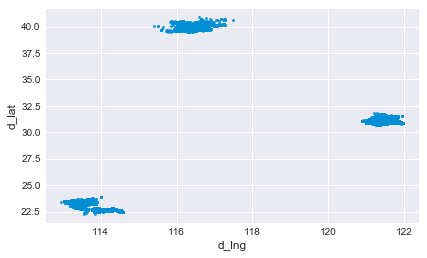

In [36]:
test_queries.plot.scatter(x='d_lng', y='d_lat',marker='.')
plt.show()

In [37]:
test_queries['d'].value_counts()[:10]

121.32,31.20    3891
116.32,39.89    3382
121.45,31.25    2573
116.37,39.86    2421
116.42,39.90    2289
113.26,22.99    2000
121.80,31.15    1979
113.32,23.13    1733
113.32,23.12    1716
113.25,23.15    1671
Name: d, dtype: int64

<Figure size 5760x5760 with 0 Axes>

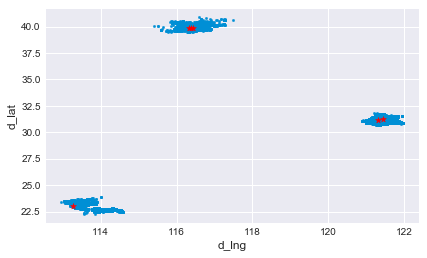

In [38]:
plt.figure(figsize=(80, 80))
test_queries.plot.scatter(x='d_lng', y='d_lat',marker='.')
plt.scatter(121.32,31.20,marker='*',c='red')
plt.scatter(116.32,39.89,marker='*',c='red')
plt.scatter(121.45,31.25,marker='*',c='red')
plt.scatter(116.37,39.86,marker='*',c='red')
plt.scatter(116.42,39.90,marker='*',c='red')
plt.scatter(113.26,22.99,marker='*',c='red')

plt.show()

发现  每个城市都会有 点出现特别密集的地方。

In [59]:
# 探索是否存在起点和终点不在一个城市的导航情况，应该不会有吧 (这里标识1为北京市  2为上海市   3为广州市  4为深圳)
#起点和终点也都是一个城市的，  ok
def gen_o_city_flag(row):
    if row['o_lat']>37.5:
        return 1
    elif row['o_lat']>27.5:
        return 2
    elif row['o_lng']>113.72 and row['o_lat']<22.87:
        return 3   
    else:
        return 4
   
def gen_d_city_flag(row):
    if row['d_lat']>37.5:
        return 1
    elif row['d_lat']>27.5:
        return 2
    elif row['o_lng']>113.72 and row['o_lat']<22.87:
        return 3   
    else:
        return 4
train_queries['o_city_flag']=train_queries[['o_lat','o_lng']].apply(gen_o_city_flag,axis=1)
train_queries['d_city_flag']=train_queries[['d_lat','d_lng']].apply(gen_d_city_flag,axis=1)

In [60]:
train_queries[train_queries['o_city_flag']!=train_queries['d_city_flag']]

,sid,pid,req_time,o,d,o_lng,o_lat,d_lng,d_lat,o_city_flag,d_city_flag
500528,1876844,NaN,2018-11-11 20:22:05,"113.63,22.26","114.03,22.52",113.63,22.26,114.03,22.52,4,3
511739,1884424,NaN,2018-10-10 12:23:43,"113.66,22.28","113.88,22.56",113.66,22.28,113.88,22.56,4,3
514040,1692805,22813.0,2018-11-06 19:34:26,"113.93,22.54","113.64,22.41",113.93,22.54,113.64,22.41,3,4
529628,1797164,NaN,2018-10-12 18:35:54,"113.91,22.49","113.58,22.28",113.91,22.49,113.58,22.28,3,4
555191,1814277,197810.0,2018-10-05 23:14:55,"113.86,22.56","113.63,22.42",113.86,22.56,113.63,22.42,3,4
566986,1828588,56811.0,2018-11-04 15:59:41,"113.54,22.39","113.85,22.77",113.54,22.39,113.85,22.77,4,3
608200,1649473,NaN,2018-10-21 19:14:41,"113.59,22.24","113.91,22.48",113.59,22.24,113.91,22.48,4,3
611449,1690567,NaN,2018-10-26 08:34:47,"114.05,22.55","113.60,22.38",114.05,22.55,113.60,22.38,3,4
611450,1553149,53062.0,2018-11-24 08:17:53,"113.64,22.42","114.05,22.55",113.64,22.42,114.05,22.55,4,3
622359,1763161,2265.0,2018-11-30 15:30:07,"113.67,22.50","114.04,22.53",113.67,22.50,114.04,22.53,4,3


In [62]:
len(train_queries[train_queries['o_city_flag']==train_queries['d_city_flag']])

1999943

## 思考点：  对不同城市的分布情况和点出现情况进行分析
flag 1 为北京     2为上海市   3为深圳市

In [63]:
train_queries['city_flag']=train_queries['o_city_flag']

In [64]:
train_queries.groupby('city_flag')['sid'].count()

city_flag
1    500000
2    500000
3    499909
4    500091
Name: sid, dtype: int64

In [65]:
train = train_queries.merge(train_plans, 'left', ['sid'])
train = train.merge(train_clicks, 'left', ['sid'])

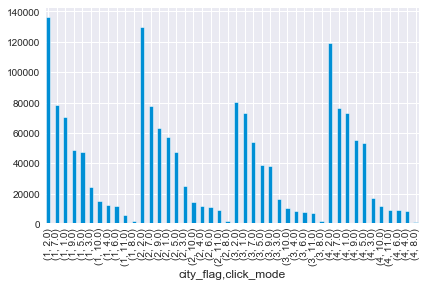

In [66]:
train.groupby('city_flag')['click_mode'].value_counts().plot.bar()

可以看出不同城市的  交通工具选择的倾向有比较大的差距吧。   有比较小的波动，其中最后一个城市 上海数据量更大，有100W数据量都是上海的。

In [67]:
for i in ['req_time']:
    train[i + '_hour'] = train[i].dt.hour
    train[i + '_weekday'] = train[i].dt.weekday

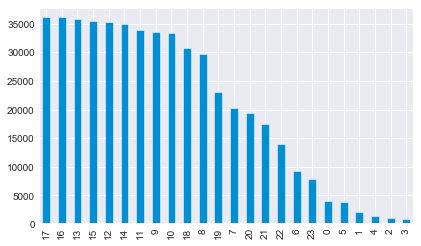

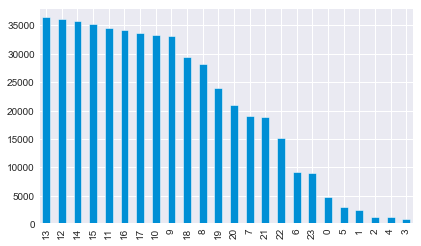

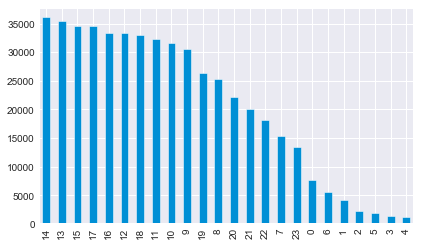

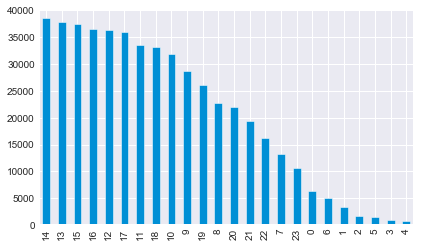

In [69]:
for i in range(1,5):
    train[train['city_flag']==i]['req_time_hour'].value_counts().plot.bar()
    plt.show()

 三个城市出行习惯，差别还是蛮大的...

## 思考点：  对阶段二的数据进行分析，真的不包含   北京的数据吗？

<Figure size 5760x5760 with 0 Axes>

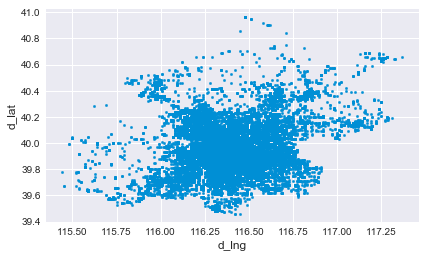

In [3]:
train_queries_phase1 = pd.read_csv(main_path+'train_queries_phase1.csv',parse_dates=['req_time'])
train_queries_phase1['o_lng'] = train_queries_phase1['o'].apply(lambda x: float(x.split(',')[0]))
train_queries_phase1['o_lat'] = train_queries_phase1['o'].apply(lambda x: float(x.split(',')[1]))
train_queries_phase1['d_lng'] = train_queries_phase1['d'].apply(lambda x: float(x.split(',')[0]))
train_queries_phase1['d_lat'] = train_queries_phase1['d'].apply(lambda x: float(x.split(',')[1])) 

plt.figure(figsize=(80, 80))
train_queries_phase1.plot.scatter(x='d_lng', y='d_lat',marker='.')

plt.show()

<Figure size 5760x5760 with 0 Axes>

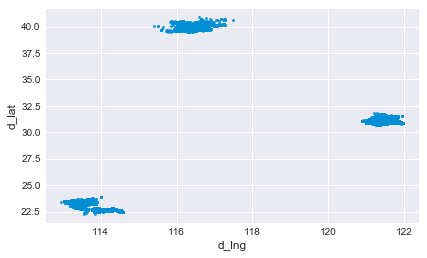

In [8]:
test_queries = pd.read_csv(main_path+'test_queries.csv',parse_dates=['req_time'])
test_queries['o_lng'] = test_queries['o'].apply(lambda x: float(x.split(',')[0]))
test_queries['o_lat'] = test_queries['o'].apply(lambda x: float(x.split(',')[1]))
test_queries['d_lng'] = test_queries['d'].apply(lambda x: float(x.split(',')[0]))
test_queries['d_lat'] = test_queries['d'].apply(lambda x: float(x.split(',')[1])) 

plt.figure(figsize=(80, 80))
test_queries.plot.scatter(x='d_lng', y='d_lat',marker='.')

plt.show()

可以发现  在测试集中三个城市都是有的，也就是说其实二阶段的数据集其实是个全集， 数据量扩大了非常多。

<Figure size 5760x5760 with 0 Axes>

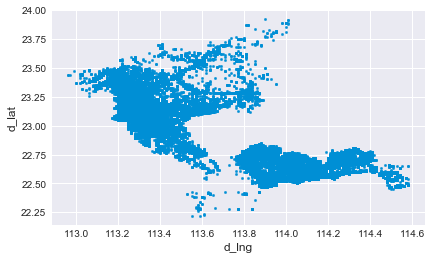

<Figure size 5760x5760 with 0 Axes>

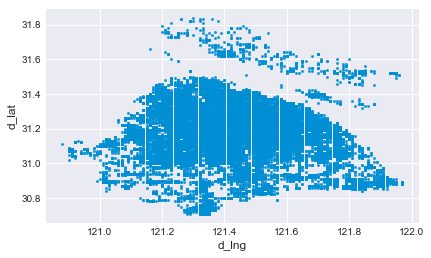

In [18]:
#专门绘制第三块的地图，  听说是分为了四个部分      进行观察，发现还真的是要分成四部分，按四部分分开建模
train_queries_disan_city=train_queries[train_queries['o_city_flag']==2]

plt.figure(figsize=(80, 80))
train_queries_disan_city.plot.scatter(x='d_lng', y='d_lat',marker='.')

plt.show()

<Figure size 5760x5760 with 0 Axes>

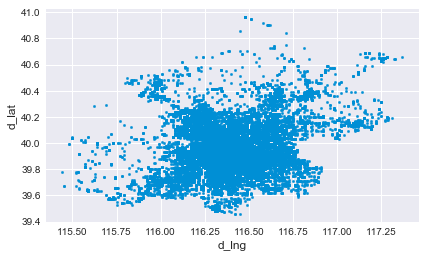

In [19]:
#专门绘制第三块的地图，  听说是分为了四个部分      进行观察，发现还真的是要分成四部分，按四部分分开建模
train_queries_disan_city=train_queries[train_queries['o_city_flag']==1]

plt.figure(figsize=(80, 80))
train_queries_disan_city.plot.scatter(x='d_lng', y='d_lat',marker='.')

plt.show()

<Figure size 5760x5760 with 0 Axes>

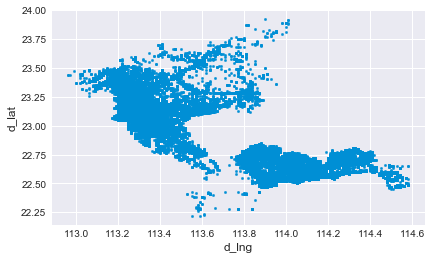

In [24]:
#专门绘制第三块的地图，  听说是分为了四个部分      进行观察，发现还真的是要分成四部分，按四部分分开建模     左边是广州市，右边是深圳市
train_queries_disan_city=train_queries[train_queries['o_city_flag']==3]

plt.figure(figsize=(80, 80))
train_queries_disan_city.plot.scatter(x='d_lng', y='d_lat',marker='.')

plt.show()

In [70]:
#做经纬度反编码
# coding=gbk
import pandas as pd
import urllib.request
import json
import re
import time
'''
本函数 用于对所有经纬度信息进行反向编码， 获取地址和位置信息 ，针对地理信息再提取特征进行使用.

这里分别对起点、终点信息进行分别的保存，注意39是 lat,116是lon、lng
'''
http='http://api.map.baidu.com/geocoder/v2/?callback=renderReverse&location=22.87,113.72&output=json&pois=1&latest_admin=1&ak=hCedZFZlgn8lOvvOId5hrXdvDZVQDrKr'
resp_orig = urllib.request.urlopen(http)
    
resp_str=str(resp_orig.read().decode('utf8'))
resp_str=resp_str[29:-2]

resp_str

'{"status":0,"result":{"location":{"lng":113.71999999999999,"lat":22.870000006249098},"formatted_address":"广东省东莞市环莞快速","business":"","addressComponent":{"country":"中国","country_code":0,"country_code_iso":"CHN","country_code_iso2":"CN","province":"广东省","city":"东莞市","city_level":2,"district":"","town":"","adcode":"441900","street":"环莞快速","street_number":"","direction":"","distance":""},"pois":[{"addr":"环莞快速路附近","cp":" ","direction":"西","distance":"376","name":"富格工业区","poiType":"公司企业","point":{"x":113.72329464634527,"y":22.869290380997634},"tag":"公司企业;园区","tel":"","uid":"0eb1ed0e1aca8e09f219375a","zip":"","parent_poi":{"name":"","tag":"","addr":"","point":{"x":0.0,"y":0.0},"direction":"","distance":"","uid":""}},{"addr":"广东省东莞市虎门镇华沣百货商店南200米","cp":" ","direction":"北","distance":"389","name":"东莞新创纪宠物用品制造有限公司","poiType":"公司企业","point":{"x":113.7198092209677,"y":22.866759612480537},"tag":"公司企业;公司","tel":"","uid":"dc3c5b082dfbc70c0bf5eb83","zip":"","parent_poi":{"name":"","tag":"","addr":"","

In [73]:

df1 = pd.DataFrame({'Country':['China','China', 'India', 'India', 'America', 'Japan', 'China', 'India'], 
                   'Income':[10000,np.nan , 5000, 5002, 40000, 50000, 8000, 5000],
                    'Age':[5000, 4321, 1234, 4010, 250, 250, 4500, 4321]})
df1.groupby('Country', as_index=False)['Income'].agg({'sloc_count': 'count'})

,Country,sloc_count
0,America,1
1,China,2
2,India,3
3,Japan,1


## 思考点：  在地图上的  mode分布情况
从分析和数据规律中寻找trick点  (eda分析真的是硬功夫)

In [ ]:
plt.figure(figsize=(80, 80))


# 作为对比，分析下广州的 mode 0的情况

In [3]:
guangzhou_data=pd.read_csv('./version3_lgb/guangzhou_version3_2019-06-11_19_26_all_features.csv',parse_dates=['req_time']) 

In [20]:
guangzhou_mode_0_data=guangzhou_data[guangzhou_data['click_mode']==0]

In [21]:
guangzhou_mode_0_data['plan_time']

6         2018-11-30 23:40:31
24        2018-11-26 11:32:30
32        2018-10-14 14:39:19
34        2018-10-01 17:23:19
36                        NaN
41        2018-10-16 21:38:17
43        2018-10-09 12:50:40
45        2018-11-02 22:25:32
61        2018-10-20 10:35:37
74        2018-11-25 09:44:04
88        2018-10-28 10:17:41
89        2018-10-12 21:29:07
93        2018-10-19 14:39:11
94        2018-10-05 12:44:05
101       2018-11-04 14:05:26
103       2018-11-11 16:49:50
104       2018-11-24 17:22:39
105                       NaN
115       2018-10-03 21:27:30
117       2018-11-30 18:27:13
118       2018-11-07 14:06:22
140       2018-10-11 11:14:00
145       2018-11-21 17:28:12
152       2018-10-05 00:41:10
155       2018-10-17 14:50:48
157                       NaN
158       2018-11-09 18:48:57
175       2018-10-04 14:17:07
177       2018-10-07 15:41:30
180                       NaN
                 ...         
499877    2018-10-07 11:06:16
499878                    NaN
499882    

In [69]:
guangzhou_mode_0=data[guangzhou_data['click_mode']==0]   
guangzhou_mode_1=data[guangzhou_data['click_mode']==1]   
guangzhou_mode_2=data[guangzhou_data['click_mode']==2]  
guangzhou_mode_3=data[guangzhou_data['click_mode']==3]   

In [70]:
guangzhou_data['click_mode'].value_counts()

 2.0     119279
 7.0      76335
 1.0      73192
-1.0      68980
 0.0      65591
 9.0      55291
 5.0      53490
 3.0      17233
 10.0     11742
 11.0      9015
 6.0       8876
 4.0       8753
 8.0       1263
Name: click_mode, dtype: int64

2018-10-01 00:01:57
2018-11-30 23:45:38
2018-10-01 00:00:09
2018-10-02 00:00:09
1908
2018-10-02 00:00:09
2018-10-03 00:00:09
0
2018-10-03 00:00:09
2018-10-04 00:00:09
1648
2018-10-04 00:00:09
2018-10-05 00:00:09
1065
2018-10-05 00:00:09
2018-10-06 00:00:09
1288
2018-10-06 00:00:09
2018-10-07 00:00:09
1085
2018-10-07 00:00:09
2018-10-08 00:00:09
1062
2018-10-08 00:00:09
2018-10-09 00:00:09
919
2018-10-09 00:00:09
2018-10-10 00:00:09
425
2018-10-10 00:00:09
2018-10-11 00:00:09
942
2018-10-11 00:00:09
2018-10-12 00:00:09
986
2018-10-12 00:00:09
2018-10-13 00:00:09
1037
2018-10-13 00:00:09
2018-10-14 00:00:09
1172
2018-10-14 00:00:09
2018-10-15 00:00:09
1162
2018-10-15 00:00:09
2018-10-16 00:00:09
793
2018-10-16 00:00:09
2018-10-17 00:00:09
1015
2018-10-17 00:00:09
2018-10-18 00:00:09
921
2018-10-18 00:00:09
2018-10-19 00:00:09
944
2018-10-19 00:00:09
2018-10-20 00:00:09
1154
2018-10-20 00:00:09
2018-10-21 00:00:09
1311
2018-10-21 00:00:09
2018-10-22 00:00:09
1307
2018-10-22 00:00:09
2018-

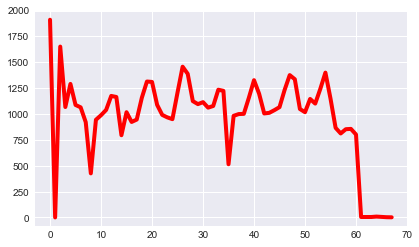

In [74]:
import datetime
start_timestamp=np.min(guangzhou_mode_0['req_time'])
end_timestamp=np.max(guangzhou_mode_0['req_time'])
print(min_date)
print(max_date)

count_list=[]
while start_timestamp<=end_timestamp:
    temp_date=start_timestamp + datetime.timedelta(hours=24)
    print(start_timestamp)
    print(temp_date)    

    print(len(guangzhou_mode_0[(guangzhou_mode_0['req_time']>=start_timestamp) &  (guangzhou_mode_0['req_time']<temp_date)]))
    count_list.append(len(guangzhou_mode_0[(guangzhou_mode_0['req_time']>start_timestamp) &  (guangzhou_mode_0['req_time']<temp_date)]))
    start_timestamp = start_timestamp + datetime.timedelta(hours=24)

plt.plot(range(len(count_list)),count_list,color='red')

In [75]:
np.sum(count_list)

65590

2018-10-01 00:01:57
2018-11-30 23:45:38
2018-10-01 00:01:33
2018-10-02 00:01:33
2198
2018-10-02 00:01:33
2018-10-03 00:01:33
0
2018-10-03 00:01:33
2018-10-04 00:01:33
1881
2018-10-04 00:01:33
2018-10-05 00:01:33
1089
2018-10-05 00:01:33
2018-10-06 00:01:33
1395
2018-10-06 00:01:33
2018-10-07 00:01:33
1263
2018-10-07 00:01:33
2018-10-08 00:01:33
1205
2018-10-08 00:01:33
2018-10-09 00:01:33
1044
2018-10-09 00:01:33
2018-10-10 00:01:33
503
2018-10-10 00:01:33
2018-10-11 00:01:33
1013
2018-10-11 00:01:33
2018-10-12 00:01:33
1035
2018-10-12 00:01:33
2018-10-13 00:01:33
1156
2018-10-13 00:01:33
2018-10-14 00:01:33
1425
2018-10-14 00:01:33
2018-10-15 00:01:33
1299
2018-10-15 00:01:33
2018-10-16 00:01:33
891
2018-10-16 00:01:33
2018-10-17 00:01:33
1068
2018-10-17 00:01:33
2018-10-18 00:01:33
1131
2018-10-18 00:01:33
2018-10-19 00:01:33
1077
2018-10-19 00:01:33
2018-10-20 00:01:33
1206
2018-10-20 00:01:33
2018-10-21 00:01:33
1537
2018-10-21 00:01:33
2018-10-22 00:01:33
1438
2018-10-22 00:01:33


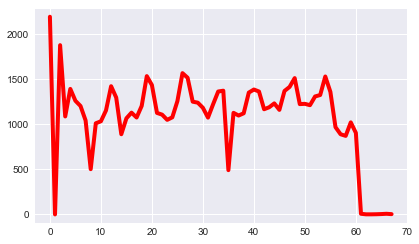

In [72]:
import datetime
start_timestamp=np.min(guangzhou_mode_1['req_time'])
end_timestamp=np.max(guangzhou_mode_1['req_time'])
print(min_date)
print(max_date)

count_list=[]
while start_timestamp<=end_timestamp:
    temp_date=start_timestamp + datetime.timedelta(hours=24)
    print(start_timestamp)
    print(temp_date)    

    print(len(guangzhou_mode_1[(guangzhou_mode_1['req_time']>=start_timestamp) &  (guangzhou_mode_1['req_time']<temp_date)]))
    count_list.append(len(guangzhou_mode_1[(guangzhou_mode_1['req_time']>start_timestamp) &  (guangzhou_mode_1['req_time']<temp_date)]))
    start_timestamp = start_timestamp + datetime.timedelta(hours=24)

plt.plot(range(len(count_list)),count_list,color='red')

In [73]:
np.sum(count_list)

73191

2018-10-01 00:01:57
2018-11-30 23:45:38
2018-10-01 00:01:57
2018-10-02 00:01:57
3487
2018-10-02 00:01:57
2018-10-03 00:01:57
2
2018-10-03 00:01:57
2018-10-04 00:01:57
2978
2018-10-04 00:01:57
2018-10-05 00:01:57
1820
2018-10-05 00:01:57
2018-10-06 00:01:57
2348
2018-10-06 00:01:57
2018-10-07 00:01:57
2120
2018-10-07 00:01:57
2018-10-08 00:01:57
1951
2018-10-08 00:01:57
2018-10-09 00:01:57
1667
2018-10-09 00:01:57
2018-10-10 00:01:57
766
2018-10-10 00:01:57
2018-10-11 00:01:57
1708
2018-10-11 00:01:57
2018-10-12 00:01:57
1767
2018-10-12 00:01:57
2018-10-13 00:01:57
1979
2018-10-13 00:01:57
2018-10-14 00:01:57
2190
2018-10-14 00:01:57
2018-10-15 00:01:57
2151
2018-10-15 00:01:57
2018-10-16 00:01:57
1389
2018-10-16 00:01:57
2018-10-17 00:01:57
1801
2018-10-17 00:01:57
2018-10-18 00:01:57
1775
2018-10-18 00:01:57
2018-10-19 00:01:57
1735
2018-10-19 00:01:57
2018-10-20 00:01:57
2039
2018-10-20 00:01:57
2018-10-21 00:01:57
2321
2018-10-21 00:01:57
2018-10-22 00:01:57
2372
2018-10-22 00:01:57

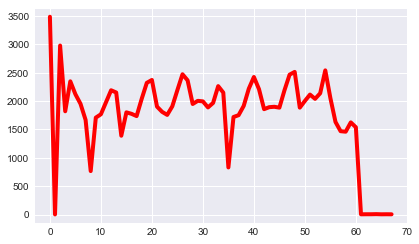

In [76]:
import datetime
start_timestamp=np.min(guangzhou_mode_2['req_time'])
end_timestamp=np.max(guangzhou_mode_2['req_time'])
print(min_date)
print(max_date)

count_list=[]
while start_timestamp<=end_timestamp:
    temp_date=start_timestamp + datetime.timedelta(hours=24)
    print(start_timestamp)
    print(temp_date)    

    print(len(guangzhou_mode_2[(guangzhou_mode_2['req_time']>=start_timestamp) &  (guangzhou_mode_2['req_time']<temp_date)]))
    count_list.append(len(guangzhou_mode_2[(guangzhou_mode_2['req_time']>start_timestamp) &  (guangzhou_mode_2['req_time']<temp_date)]))
    start_timestamp = start_timestamp + datetime.timedelta(hours=24)

plt.plot(range(len(count_list)),count_list,color='red')

In [77]:
np.sum(count_list)

119277

2018-10-01 00:01:57
2018-11-30 23:45:38
2018-10-01 00:04:27
2018-10-02 00:04:27
520
2018-10-02 00:04:27
2018-10-03 00:04:27
0
2018-10-03 00:04:27
2018-10-04 00:04:27
435
2018-10-04 00:04:27
2018-10-05 00:04:27
253
2018-10-05 00:04:27
2018-10-06 00:04:27
326
2018-10-06 00:04:27
2018-10-07 00:04:27
289
2018-10-07 00:04:27
2018-10-08 00:04:27
278
2018-10-08 00:04:27
2018-10-09 00:04:27
242
2018-10-09 00:04:27
2018-10-10 00:04:27
115
2018-10-10 00:04:27
2018-10-11 00:04:27
231
2018-10-11 00:04:27
2018-10-12 00:04:27
272
2018-10-12 00:04:27
2018-10-13 00:04:27
308
2018-10-13 00:04:27
2018-10-14 00:04:27
323
2018-10-14 00:04:27
2018-10-15 00:04:27
299
2018-10-15 00:04:27
2018-10-16 00:04:27
224
2018-10-16 00:04:27
2018-10-17 00:04:27
269
2018-10-17 00:04:27
2018-10-18 00:04:27
269
2018-10-18 00:04:27
2018-10-19 00:04:27
246
2018-10-19 00:04:27
2018-10-20 00:04:27
295
2018-10-20 00:04:27
2018-10-21 00:04:27
341
2018-10-21 00:04:27
2018-10-22 00:04:27
344
2018-10-22 00:04:27
2018-10-23 00:04:2

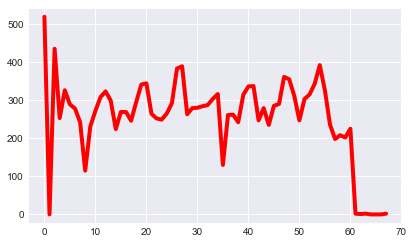

In [83]:
import datetime
start_timestamp=np.min(guangzhou_mode_3['req_time'])
end_timestamp=np.max(guangzhou_mode_3['req_time'])
print(min_date)
print(max_date)

count_list=[]
while start_timestamp<=end_timestamp:
    temp_date=start_timestamp + datetime.timedelta(hours=24)
    print(start_timestamp)
    print(temp_date)    

    print(len(guangzhou_mode_3[(guangzhou_mode_3['req_time']>=start_timestamp) &  (guangzhou_mode_3['req_time']<temp_date)]))
    count_list.append(len(guangzhou_mode_3[(guangzhou_mode_3['req_time']>start_timestamp) &  (guangzhou_mode_3['req_time']<temp_date)]))
    start_timestamp = start_timestamp + datetime.timedelta(hours=24)

plt.plot(range(len(count_list)),count_list,color='red')

# 对深圳市的 mode 0特殊情况的分析

In [3]:
data=pd.read_csv('./version3_lgb/shenzhen_version3_2019-06-11_16_20_all_features.csv',parse_dates=['req_time']) 

In [4]:
data.columns.values

array(['click_mode', 'd', 'o', 'pid', 'plan_time', 'plans', 'req_time',
       'sid', 'o_lng', 'o_lat', 'd_lng', 'd_lat', 'city_flag_o',
       'od_manhattan_distance', 'od_manhattan_distance_detail',
       'o_main_centroid_mean_dis', 'd_main_centroid_mean_dis',
       'o_main_centroid_mode_dis', 'd_main_centroid_mode_dis',
       "('o_cluster', 'd_cluster')", 'o_cluster', 'd_cluster',
       'manhattan', 'euclidean', 'delta_longitude', 'delta_latitude',
       'pickup_x', 'pickup_y', 'pickup_z', 'dropoff_x', 'dropoff_y',
       'dropoff_z', 'direction', 'req_time_hour', 'req_time_weekday',
       'req_time_minute', 'req_time_date_d', 'time_diff', 'diff_6_cloc',
       'diff_12_clock', 'diff_18_clock', 'diff_24_clock', 'svd_fea_0',
       'svd_fea_1', 'svd_fea_2', 'svd_fea_3', 'svd_fea_4', 'svd_fea_5',
       'svd_fea_6', 'svd_fea_7', 'svd_fea_8', 'svd_fea_9', 'plans_json',
       'mode_feas_0', 'mode_feas_1', 'mode_feas_2', 'mode_feas_3',
       'mode_feas_4', 'mode_feas_5', 'mode_fe

In [11]:
data['o']

0         114.12,22.55
1         113.84,22.81
2         113.90,22.75
3         113.98,22.54
4         113.84,22.62
5         113.83,22.63
6         113.90,22.57
7         113.98,22.54
8         114.05,22.63
9         114.09,22.57
10        114.11,22.54
11        114.07,22.63
12        113.92,22.65
13        114.06,22.54
14        114.43,22.61
15        114.11,22.53
16        114.05,22.54
17        114.04,22.54
18        113.89,22.56
19        113.84,22.60
20        113.92,22.59
21        113.80,22.65
22        113.94,22.53
23        114.02,22.62
24        113.94,22.51
25        114.19,22.64
26        114.06,22.57
27        113.82,22.71
28        113.82,22.70
29        114.09,22.54
              ...     
555493    114.03,22.57
555494    114.04,22.53
555495    114.12,22.60
555496    114.02,22.63
555497    113.86,22.58
555498    114.07,22.52
555499    114.13,22.55
555500    113.92,22.52
555501    114.03,22.63
555502    114.11,22.61
555503    114.05,22.55
555504    114.06,22.71
555505    1

In [10]:
data['click_mode'].value_counts()

 0.0     162108
 2.0      80651
 1.0      73267
-1.0      55641
 7.0      54206
 5.0      38903
 9.0      38104
 3.0      16327
 10.0     10432
 4.0       8742
 6.0       8077
 11.0      7281
 8.0       1784
Name: click_mode, dtype: int64

In [6]:
mode_0_data=data[data['click_mode']==0]

In [16]:
mode_0_data

,click_mode,d,o,pid,plan_time,plans,req_time,sid,o_lng,o_lat,...,sloc_eloc_common_conn1_rate,sloc_eloc_common_conn2_rate,user_sloc_eloc_common_eloc_count,user_sloc_eloc_common_sloc_count,user_sloc_eloc_common_conn1_count,user_sloc_eloc_common_conn2_count,user_sloc_eloc_common_eloc_rate,user_sloc_eloc_common_sloc_rate,user_sloc_eloc_common_conn1_rate,user_sloc_eloc_common_conn2_rate
2,0.0,"114.01,22.64","113.90,22.75",4564.0,NaN,NaN,2018-11-30 09:26:06,1670098,113.90,22.75,...,0.279821,0.467381,0,0,0,0,NaN,NaN,0.000000,NaN
3,0.0,"114.32,22.61","113.98,22.54",27428.0,2018-10-04 22:32:47,"[{""distance"": 45014, ""price"": """", ""eta"": 8333,...",2018-10-04 22:32:47,1949310,113.98,22.54,...,0.771429,0.271882,0,0,0,0,NaN,NaN,0.000000,NaN
10,0.0,"114.30,22.60","114.11,22.54",NaN,2018-10-08 20:43:45,"[{""distance"": 23907, ""price"": """", ""eta"": 4071,...",2018-10-08 20:43:45,1629103,114.11,22.54,...,1.326273,1.069526,0,0,0,0,NaN,NaN,NaN,NaN
15,0.0,"113.94,22.59","114.11,22.53",7005.0,NaN,NaN,2018-10-18 23:04:57,1619702,114.11,22.53,...,0.906731,1.029158,0,0,0,0,NaN,NaN,0.000000,NaN
27,0.0,"113.82,22.71","113.82,22.71",15681.0,NaN,NaN,2018-11-12 22:06:24,1755572,113.82,22.71,...,0.574468,0.636126,2,2,2,2,1.000000,1.000000,1.000000,1.000000
28,0.0,"114.09,22.55","113.82,22.70",15660.0,2018-10-22 10:58:28,"[{""distance"": 45738, ""price"": 1000, ""eta"": 474...",2018-10-22 10:58:28,1613201,113.82,22.70,...,0.580938,0.360424,0,0,0,0,NaN,NaN,0.000000,NaN
31,0.0,"113.79,22.69","113.81,22.70",52237.0,2018-10-01 12:47:47,"[{""distance"": 4235, ""price"": 200, ""eta"": 1940,...",2018-10-01 12:47:47,1543800,113.81,22.70,...,0.723776,0.602585,0,0,0,0,NaN,NaN,0.000000,NaN
39,0.0,"113.93,22.53","114.07,22.64",8645.0,2018-10-25 12:23:20,"[{""distance"": 31545, ""price"": 700, ""eta"": 4146...",2018-10-25 12:23:20,1559587,114.07,22.64,...,0.645006,0.550075,20,0,22,0,0.126582,0.000000,0.220000,0.000000
42,0.0,"113.86,22.54","114.26,22.59",4067.0,2018-10-30 19:00:44,"[{""distance"": 58334, ""price"": """", ""eta"": 7992,...",2018-10-30 19:00:44,1629465,114.26,22.59,...,0.145251,0.013072,0,0,0,0,NaN,NaN,0.000000,NaN
43,0.0,"113.94,22.49","113.92,22.49",52633.0,2018-10-20 11:54:39,"[{""distance"": 2385, ""price"": 200, ""eta"": 1575,...",2018-10-20 11:54:39,1646045,113.92,22.49,...,0.962000,0.950713,0,0,0,0,NaN,NaN,0.000000,NaN


In [18]:
mode_0_data['plan_time']

2                         NaN
3         2018-10-04 22:32:47
10        2018-10-08 20:43:45
15                        NaN
27                        NaN
28        2018-10-22 10:58:28
31        2018-10-01 12:47:47
39        2018-10-25 12:23:20
42        2018-10-30 19:00:44
43        2018-10-20 11:54:39
44        2018-10-31 08:04:55
51                        NaN
54        2018-10-20 18:29:33
55        2018-10-22 09:36:07
56        2018-10-09 20:06:54
58        2018-10-23 09:02:59
64        2018-10-30 16:59:35
69        2018-10-10 18:55:26
71        2018-11-17 23:12:22
75        2018-10-24 16:06:38
80        2018-10-03 14:19:28
81        2018-10-24 20:29:03
86        2018-11-23 23:24:10
97        2018-10-07 11:46:53
102       2018-10-09 22:18:57
105       2018-10-15 11:47:06
111                       NaN
112       2018-11-08 07:52:27
116       2018-10-31 09:25:22
117                       NaN
                 ...         
499808    2018-10-10 12:50:57
499813    2018-11-01 17:12:27
499814    

<Figure size 5760x5760 with 0 Axes>

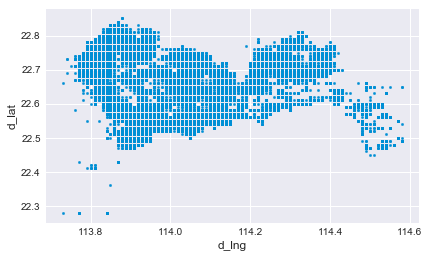

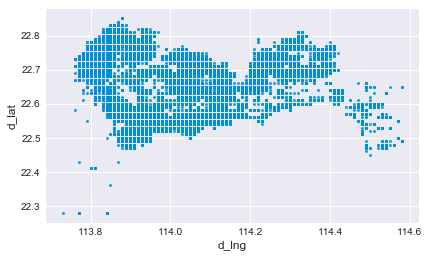

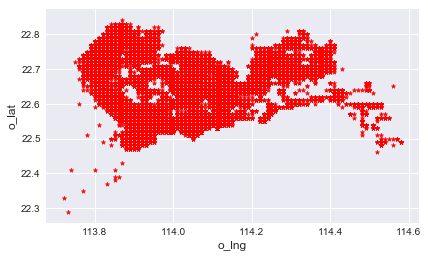

In [27]:
plt.figure(figsize=(80, 80))
data.plot.scatter(x='d_lng', y='d_lat',marker='.')
mode_0_data.plot.scatter(x='d_lng', y='d_lat',marker='.')
mode_0_data.plot.scatter(x='o_lng', y='o_lat',marker='*',color='red')
plt.show()

因为 mode 0有大量的数量，所以其 分布的形式是跟大的形式基本是完全相同的。       里面可能有很多未点击的，但是感觉更大的情况是 存在一些错误的问题，导致  错误生成很多mode 0

<Figure size 5760x5760 with 0 Axes>

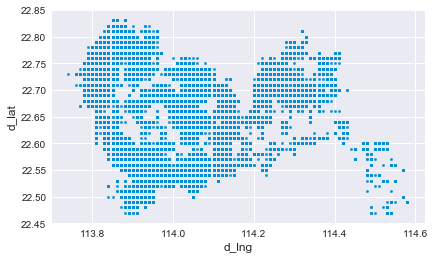

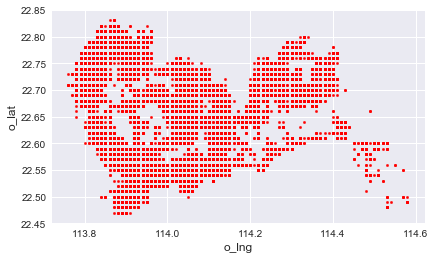

In [24]:
mode_1_data=data[data['click_mode']==1]
plt.figure(figsize=(80, 80))
mode_1_data.plot.scatter(x='d_lng', y='d_lat',marker='.')
mode_1_data.plot.scatter(x='o_lng', y='o_lat',marker='.',color='red')
plt.show()

<Figure size 5760x5760 with 0 Axes>

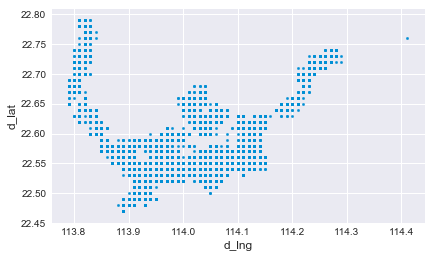

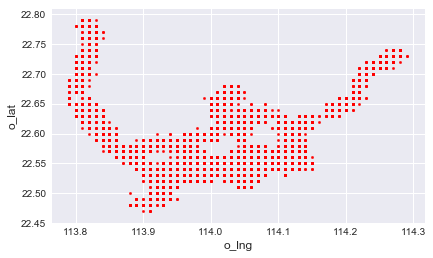

In [25]:
mode_2_data=data[data['click_mode']==2]
plt.figure(figsize=(80, 80))
mode_2_data.plot.scatter(x='d_lng', y='d_lat',marker='.')
mode_2_data.plot.scatter(x='o_lng', y='o_lat',marker='.',color='red')
plt.show()

<Figure size 5760x5760 with 0 Axes>

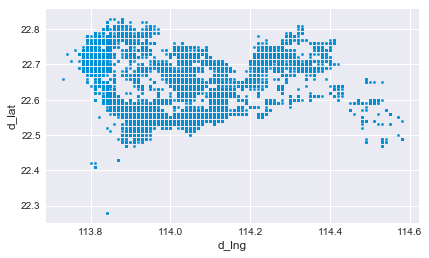

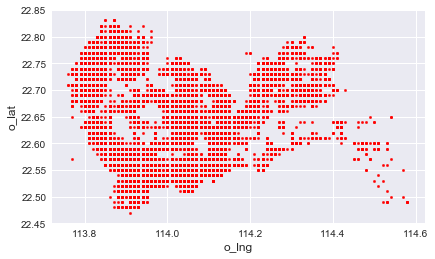

In [28]:
mode_3_data=data[data['click_mode']==3]
plt.figure(figsize=(80, 80))
mode_3_data.plot.scatter(x='d_lng', y='d_lat',marker='.')
mode_3_data.plot.scatter(x='o_lng', y='o_lat',marker='.',color='red')
plt.show()

2018-10-01 00:01:57
2018-11-30 23:45:38


In [26]:
import datetime
start_timestamp=np.min(mode_0_data['req_time'])
end_timestamp=np.max(mode_0_data['req_time'])
print(start_timestamp)
print(end_timestamp)

count_list=[]
while start_timestamp<=end_timestamp:
    temp_date=start_timestamp + datetime.timedelta(hours=24)
    print(start_timestamp)
    print(temp_date)    
    
    print(len(mode_0_data[(mode_0_data['req_time']>=start_timestamp) &  (mode_0_data['req_time']<temp_date)]))
    count_list.append(len(mode_0_data[(mode_0_data['req_time']>start_timestamp) &  (mode_0_data['req_time']<temp_date)]))
    start_timestamp = start_timestamp + datetime.timedelta(hours=24)
    

2018-10-01 00:00:09
2018-11-30 23:59:05
2018-10-01 00:00:09
2018-10-02 00:00:09
4642
2018-10-02 00:00:09
2018-10-03 00:00:09
1
2018-10-03 00:00:09
2018-10-04 00:00:09
3695
2018-10-04 00:00:09
2018-10-05 00:00:09
3893
2018-10-05 00:00:09
2018-10-06 00:00:09
2888
2018-10-06 00:00:09
2018-10-07 00:00:09
2739
2018-10-07 00:00:09
2018-10-08 00:00:09
2689
2018-10-08 00:00:09
2018-10-09 00:00:09
2432
2018-10-09 00:00:09
2018-10-10 00:00:09
3314
2018-10-10 00:00:09
2018-10-11 00:00:09
2306
2018-10-11 00:00:09
2018-10-12 00:00:09
2402
2018-10-12 00:00:09
2018-10-13 00:00:09
2802
2018-10-13 00:00:09
2018-10-14 00:00:09
3130
2018-10-14 00:00:09
2018-10-15 00:00:09
3077
2018-10-15 00:00:09
2018-10-16 00:00:09
2982
2018-10-16 00:00:09
2018-10-17 00:00:09
2399
2018-10-17 00:00:09
2018-10-18 00:00:09
2471
2018-10-18 00:00:09
2018-10-19 00:00:09
2355
2018-10-19 00:00:09
2018-10-20 00:00:09
2826
2018-10-20 00:00:09
2018-10-21 00:00:09
3200
2018-10-21 00:00:09
2018-10-22 00:00:09
3207
2018-10-22 00:00:0

In [27]:
count_list

[4641,
 1,
 3695,
 3893,
 2888,
 2739,
 2689,
 2432,
 3314,
 2306,
 2402,
 2802,
 3130,
 3077,
 2982,
 2399,
 2471,
 2355,
 2826,
 3200,
 3207,
 2620,
 2429,
 2541,
 2399,
 2965,
 3453,
 3220,
 2737,
 2609,
 2678,
 2509,
 2657,
 2880,
 2960,
 3498,
 2306,
 2317,
 2453,
 2782,
 2879,
 2681,
 2246,
 2285,
 2302,
 2333,
 2780,
 2884,
 3017,
 2343,
 2376,
 2561,
 2422,
 2589,
 2945,
 2546,
 1797,
 1686,
 1714,
 1859,
 2398]

In [28]:
sum(count_list)

162105

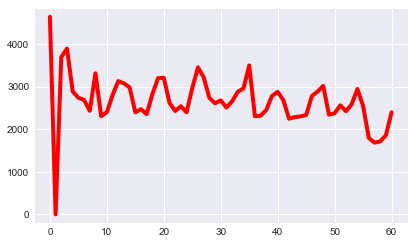

In [10]:

plt.plot(range(len(count_list)),count_list,color='red')


2018-10-02 00:00:09 到  2018-10-03 00:00:09  下的mode 0数量为1 。   这一天是放假周二

In [55]:
count_list

[4641,
 1,
 3695,
 3893,
 2888,
 2739,
 2689,
 2432,
 3314,
 2306,
 2402,
 2802,
 3130,
 3077,
 2982,
 2399,
 2471,
 2355,
 2826,
 3200,
 3207,
 2620,
 2429,
 2541,
 2399,
 2965,
 3453,
 3220,
 2737,
 2609,
 2678,
 2509,
 2657,
 2880,
 2960,
 3498,
 2306,
 2317,
 2453,
 2782,
 2879,
 2681,
 2246,
 2285,
 2302,
 2333,
 2780,
 2884,
 3017,
 2343,
 2376,
 2561,
 2422,
 2589,
 2945,
 2546,
 1797,
 1686,
 1714,
 1859,
 2398]

In [56]:
np.sum(count_list)

162105

In [21]:
data['click_mode'].value_counts()

 0.0     162108
 2.0      80651
 1.0      73267
-1.0      55641
 7.0      54206
 5.0      38903
 9.0      38104
 3.0      16327
 10.0     10432
 4.0       8742
 6.0       8077
 11.0      7281
 8.0       1784
Name: click_mode, dtype: int64

2018-10-01 00:01:57
2018-11-30 23:45:38
2018-10-01 00:01:57
2018-10-02 00:01:57
2071
2018-10-02 00:01:57
2018-10-03 00:01:57
2
2018-10-03 00:01:57
2018-10-04 00:01:57
1796
2018-10-04 00:01:57
2018-10-05 00:01:57
748
2018-10-05 00:01:57
2018-10-06 00:01:57
1398
2018-10-06 00:01:57
2018-10-07 00:01:57
1230
2018-10-07 00:01:57
2018-10-08 00:01:57
1250
2018-10-08 00:01:57
2018-10-09 00:01:57
1015
2018-10-09 00:01:57
2018-10-10 00:01:57
0
2018-10-10 00:01:57
2018-10-11 00:01:57
1117
2018-10-11 00:01:57
2018-10-12 00:01:57
1156
2018-10-12 00:01:57
2018-10-13 00:01:57
1244
2018-10-13 00:01:57
2018-10-14 00:01:57
1294
2018-10-14 00:01:57
2018-10-15 00:01:57
1258
2018-10-15 00:01:57
2018-10-16 00:01:57
701
2018-10-16 00:01:57
2018-10-17 00:01:57
1071
2018-10-17 00:01:57
2018-10-18 00:01:57
1150
2018-10-18 00:01:57
2018-10-19 00:01:57
1025
2018-10-19 00:01:57
2018-10-20 00:01:57
1238
2018-10-20 00:01:57
2018-10-21 00:01:57
1374
2018-10-21 00:01:57
2018-10-22 00:01:57
1534
2018-10-22 00:01:57
201

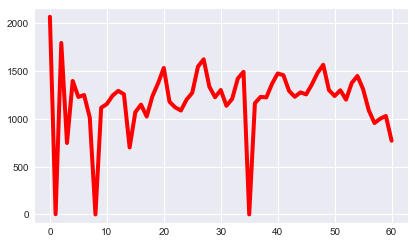

In [13]:
mode_1_data=data[data['click_mode']==1]
import datetime
start_timestamp=np.min(mode_1_data['req_time'])
end_timestamp=np.max(mode_1_data['req_time'])
print(start_timestamp)
print(end_timestamp)

count_list=[]
while start_timestamp<=end_timestamp:
    temp_date=start_timestamp + datetime.timedelta(hours=24)
    print(start_timestamp)
    print(temp_date)    

    print(len(mode_1_data[(mode_1_data['req_time']>=start_timestamp) &  (mode_1_data['req_time']<temp_date)]))
    count_list.append(len(mode_1_data[(mode_1_data['req_time']>start_timestamp) &  (mode_1_data['req_time']<temp_date)]))
    start_timestamp = start_timestamp + datetime.timedelta(hours=24)

plt.plot(range(len(count_list)),count_list,color='red')

2018-11-05   周一

In [15]:
np.sum(count_list)

73265

2018-10-01 00:03:34
2018-11-30 23:55:33
2018-10-01 00:03:34
2018-10-02 00:03:34
2389
2018-10-02 00:03:34
2018-10-03 00:03:34
2
2018-10-03 00:03:34
2018-10-04 00:03:34
2266
2018-10-04 00:03:34
2018-10-05 00:03:34
1046
2018-10-05 00:03:34
2018-10-06 00:03:34
1586
2018-10-06 00:03:34
2018-10-07 00:03:34
1529
2018-10-07 00:03:34
2018-10-08 00:03:34
1252
2018-10-08 00:03:34
2018-10-09 00:03:34
1027
2018-10-09 00:03:34
2018-10-10 00:03:34
0
2018-10-10 00:03:34
2018-10-11 00:03:34
1086
2018-10-11 00:03:34
2018-10-12 00:03:34
1059
2018-10-12 00:03:34
2018-10-13 00:03:34
1206
2018-10-13 00:03:34
2018-10-14 00:03:34
1337
2018-10-14 00:03:34
2018-10-15 00:03:34
1341
2018-10-15 00:03:34
2018-10-16 00:03:34
695
2018-10-16 00:03:34
2018-10-17 00:03:34
1222
2018-10-17 00:03:34
2018-10-18 00:03:34
1216
2018-10-18 00:03:34
2018-10-19 00:03:34
1202
2018-10-19 00:03:34
2018-10-20 00:03:34
1360
2018-10-20 00:03:34
2018-10-21 00:03:34
1607
2018-10-21 00:03:34
2018-10-22 00:03:34
1555
2018-10-22 00:03:34
20

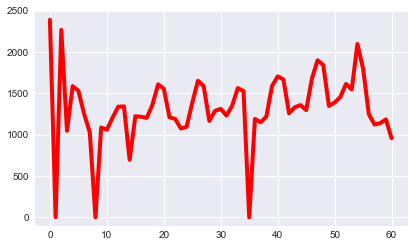

In [19]:
mode_2_data=data[data['click_mode']==2]
import datetime
start_timestamp=np.min(mode_2_data['req_time'])
end_timestamp=np.max(mode_2_data['req_time'])
print(start_timestamp)
print(end_timestamp)

count_list=[]
while start_timestamp<=end_timestamp:
    temp_date=start_timestamp + datetime.timedelta(hours=24)
    print(start_timestamp)
    print(temp_date)    

    print(len(mode_2_data[(mode_2_data['req_time']>=start_timestamp) &  (mode_2_data['req_time']<temp_date)]))
    count_list.append(len(mode_2_data[(mode_2_data['req_time']>start_timestamp) &  (mode_2_data['req_time']<temp_date)]))
    start_timestamp = start_timestamp + datetime.timedelta(hours=24)

plt.plot(range(len(count_list)),count_list,color='red')

In [20]:
np.sum(count_list)

80650

2018-10-01 00:01:57
2018-11-30 23:45:38
2018-10-01 00:02:19
2018-10-02 00:02:19
562
2018-10-02 00:02:19
2018-10-03 00:02:19
0
2018-10-03 00:02:19
2018-10-04 00:02:19
480
2018-10-04 00:02:19
2018-10-05 00:02:19
199
2018-10-05 00:02:19
2018-10-06 00:02:19
318
2018-10-06 00:02:19
2018-10-07 00:02:19
327
2018-10-07 00:02:19
2018-10-08 00:02:19
324
2018-10-08 00:02:19
2018-10-09 00:02:19
238
2018-10-09 00:02:19
2018-10-10 00:02:19
1
2018-10-10 00:02:19
2018-10-11 00:02:19
266
2018-10-11 00:02:19
2018-10-12 00:02:19
259
2018-10-12 00:02:19
2018-10-13 00:02:19
290
2018-10-13 00:02:19
2018-10-14 00:02:19
352
2018-10-14 00:02:19
2018-10-15 00:02:19
347
2018-10-15 00:02:19
2018-10-16 00:02:19
175
2018-10-16 00:02:19
2018-10-17 00:02:19
274
2018-10-17 00:02:19
2018-10-18 00:02:19
287
2018-10-18 00:02:19
2018-10-19 00:02:19
257
2018-10-19 00:02:19
2018-10-20 00:02:19
301
2018-10-20 00:02:19
2018-10-21 00:02:19
334
2018-10-21 00:02:19
2018-10-22 00:02:19
315
2018-10-22 00:02:19
2018-10-23 00:02:19


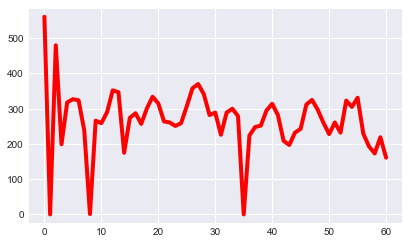

In [78]:
import datetime
start_timestamp=np.min(mode_3_data['req_time'])
end_timestamp=np.max(mode_3_data['req_time'])
print(min_date)
print(max_date)

count_list=[]
while start_timestamp<=end_timestamp:
    temp_date=start_timestamp + datetime.timedelta(hours=24)
    print(start_timestamp)
    print(temp_date)    

    print(len(mode_3_data[(mode_3_data['req_time']>=start_timestamp) &  (mode_3_data['req_time']<temp_date)]))
    count_list.append(len(mode_3_data[(mode_3_data['req_time']>start_timestamp) &  (mode_3_data['req_time']<temp_date)]))
    start_timestamp = start_timestamp + datetime.timedelta(hours=24)

plt.plot(range(len(count_list)),count_list,color='red')

In [79]:
np.sum(count_list)

16326

2018-10-01 00:01:57
2018-11-30 23:45:38
2018-10-01 00:11:22
2018-10-02 00:11:22
323
2018-10-02 00:11:22
2018-10-03 00:11:22
3
2018-10-03 00:11:22
2018-10-04 00:11:22
236
2018-10-04 00:11:22
2018-10-05 00:11:22
108
2018-10-05 00:11:22
2018-10-06 00:11:22
213
2018-10-06 00:11:22
2018-10-07 00:11:22
156
2018-10-07 00:11:22
2018-10-08 00:11:22
163
2018-10-08 00:11:22
2018-10-09 00:11:22
141
2018-10-09 00:11:22
2018-10-10 00:11:22
0
2018-10-10 00:11:22
2018-10-11 00:11:22
113
2018-10-11 00:11:22
2018-10-12 00:11:22
130
2018-10-12 00:11:22
2018-10-13 00:11:22
164
2018-10-13 00:11:22
2018-10-14 00:11:22
192
2018-10-14 00:11:22
2018-10-15 00:11:22
170
2018-10-15 00:11:22
2018-10-16 00:11:22
82
2018-10-16 00:11:22
2018-10-17 00:11:22
164
2018-10-17 00:11:22
2018-10-18 00:11:22
152
2018-10-18 00:11:22
2018-10-19 00:11:22
132
2018-10-19 00:11:22
2018-10-20 00:11:22
186
2018-10-20 00:11:22
2018-10-21 00:11:22
170
2018-10-21 00:11:22
2018-10-22 00:11:22
200
2018-10-22 00:11:22
2018-10-23 00:11:22
1

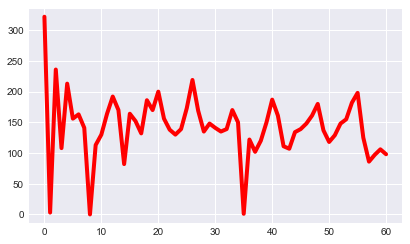

In [81]:
mode_4_data=data[data['click_mode']==4]
import datetime
start_timestamp=np.min(mode_4_data['req_time'])
end_timestamp=np.max(mode_4_data['req_time'])
print(min_date)
print(max_date)

count_list=[]
while start_timestamp<=end_timestamp:
    temp_date=start_timestamp + datetime.timedelta(hours=24)
    print(start_timestamp)
    print(temp_date)    

    print(len(mode_4_data[(mode_4_data['req_time']>=start_timestamp) &  (mode_4_data['req_time']<temp_date)]))
    count_list.append(len(mode_4_data[(mode_4_data['req_time']>start_timestamp) &  (mode_4_data['req_time']<temp_date)]))
    start_timestamp = start_timestamp + datetime.timedelta(hours=24)

plt.plot(range(len(count_list)),count_list,color='red')

出现问题的时间点：  
2018-10-02 00:11:22   
          2018-10-09 00:11:22     
           2018-11-05 00:11:22

2018-10-22 17:37:04
2018-11-30 23:19:14
2018-10-22 17:37:04
2018-10-23 17:37:04
40
2018-10-23 17:37:04
2018-10-24 17:37:04
36
2018-10-24 17:37:04
2018-10-25 17:37:04
58
2018-10-25 17:37:04
2018-10-26 17:37:04
66
2018-10-26 17:37:04
2018-10-27 17:37:04
71
2018-10-27 17:37:04
2018-10-28 17:37:04
91
2018-10-28 17:37:04
2018-10-29 17:37:04
59
2018-10-29 17:37:04
2018-10-30 17:37:04
76
2018-10-30 17:37:04
2018-10-31 17:37:04
58
2018-10-31 17:37:04
2018-11-01 17:37:04
64
2018-11-01 17:37:04
2018-11-02 17:37:04
48
2018-11-02 17:37:04
2018-11-03 17:37:04
65
2018-11-03 17:37:04
2018-11-04 17:37:04
72
2018-11-04 17:37:04
2018-11-05 17:37:04
14
2018-11-05 17:37:04
2018-11-06 17:37:04
35
2018-11-06 17:37:04
2018-11-07 17:37:04
42
2018-11-07 17:37:04
2018-11-08 17:37:04
61
2018-11-08 17:37:04
2018-11-09 17:37:04
57
2018-11-09 17:37:04
2018-11-10 17:37:04
83
2018-11-10 17:37:04
2018-11-11 17:37:04
66
2018-11-11 17:37:04
2018-11-12 17:37:04
62
2018-11-12 17:37:04
2018-11-13 17:37:04
43
2018-11-13 17:

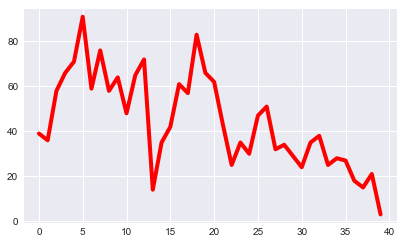

In [24]:
mode_11_data=data[data['click_mode']==8]
import datetime
start_timestamp=np.min(mode_11_data['req_time'])
end_timestamp=np.max(mode_11_data['req_time'])
print(start_timestamp)
print(end_timestamp)

count_list=[]
while start_timestamp<=end_timestamp:
    temp_date=start_timestamp + datetime.timedelta(hours=24)
    print(start_timestamp)
    print(temp_date)    

    print(len(mode_11_data[(mode_11_data['req_time']>=start_timestamp) &  (mode_11_data['req_time']<temp_date)]))
    count_list.append(len(mode_11_data[(mode_11_data['req_time']>start_timestamp) &  (mode_11_data['req_time']<temp_date)]))
    start_timestamp = start_timestamp + datetime.timedelta(hours=24)

plt.plot(range(len(count_list)),count_list,color='red')

2018-10-22 17:37:04
2018-11-30 23:19:14
2018-10-22 17:37:04
2018-10-23 17:37:04
40
2018-10-23 17:37:04
2018-10-24 17:37:04
36
2018-10-24 17:37:04
2018-10-25 17:37:04
58
2018-10-25 17:37:04
2018-10-26 17:37:04
66
2018-10-26 17:37:04
2018-10-27 17:37:04
71
2018-10-27 17:37:04
2018-10-28 17:37:04
91
2018-10-28 17:37:04
2018-10-29 17:37:04
59
2018-10-29 17:37:04
2018-10-30 17:37:04
76
2018-10-30 17:37:04
2018-10-31 17:37:04
58
2018-10-31 17:37:04
2018-11-01 17:37:04
64
2018-11-01 17:37:04
2018-11-02 17:37:04
48
2018-11-02 17:37:04
2018-11-03 17:37:04
65
2018-11-03 17:37:04
2018-11-04 17:37:04
72
2018-11-04 17:37:04
2018-11-05 17:37:04
14
2018-11-05 17:37:04
2018-11-06 17:37:04
35
2018-11-06 17:37:04
2018-11-07 17:37:04
42
2018-11-07 17:37:04
2018-11-08 17:37:04
61
2018-11-08 17:37:04
2018-11-09 17:37:04
57
2018-11-09 17:37:04
2018-11-10 17:37:04
83
2018-11-10 17:37:04
2018-11-11 17:37:04
66
2018-11-11 17:37:04
2018-11-12 17:37:04
62
2018-11-12 17:37:04
2018-11-13 17:37:04
43
2018-11-13 17:

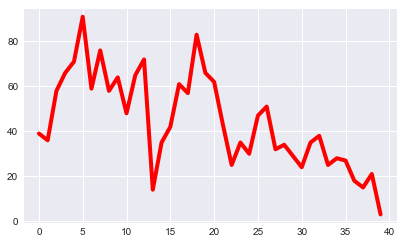

In [23]:
mode_8_data=data[data['click_mode']==8]
import datetime
start_timestamp=np.min(mode_8_data['req_time'])
end_timestamp=np.max(mode_8_data['req_time'])
print(start_timestamp)
print(end_timestamp)

count_list=[]
while start_timestamp<=end_timestamp:
    temp_date=start_timestamp + datetime.timedelta(hours=24)
    print(start_timestamp)
    print(temp_date)    

    print(len(mode_8_data[(mode_8_data['req_time']>=start_timestamp) &  (mode_8_data['req_time']<temp_date)]))
    count_list.append(len(mode_8_data[(mode_8_data['req_time']>start_timestamp) &  (mode_8_data['req_time']<temp_date)]))
    start_timestamp = start_timestamp + datetime.timedelta(hours=24)

plt.plot(range(len(count_list)),count_list,color='red')

2018-10-01 00:27:03
2018-11-30 22:24:20
2018-10-01 00:27:03
2018-10-02 00:27:03
212
2018-10-02 00:27:03
2018-10-03 00:27:03
3
2018-10-03 00:27:03
2018-10-04 00:27:03
172
2018-10-04 00:27:03
2018-10-05 00:27:03
98
2018-10-05 00:27:03
2018-10-06 00:27:03
172
2018-10-06 00:27:03
2018-10-07 00:27:03
119
2018-10-07 00:27:03
2018-10-08 00:27:03
141
2018-10-08 00:27:03
2018-10-09 00:27:03
138
2018-10-09 00:27:03
2018-10-10 00:27:03
1
2018-10-10 00:27:03
2018-10-11 00:27:03
144
2018-10-11 00:27:03
2018-10-12 00:27:03
183
2018-10-12 00:27:03
2018-10-13 00:27:03
191
2018-10-13 00:27:03
2018-10-14 00:27:03
178
2018-10-14 00:27:03
2018-10-15 00:27:03
196
2018-10-15 00:27:03
2018-10-16 00:27:03
86
2018-10-16 00:27:03
2018-10-17 00:27:03
143
2018-10-17 00:27:03
2018-10-18 00:27:03
115
2018-10-18 00:27:03
2018-10-19 00:27:03
115
2018-10-19 00:27:03
2018-10-20 00:27:03
155
2018-10-20 00:27:03
2018-10-21 00:27:03
188
2018-10-21 00:27:03
2018-10-22 00:27:03
213
2018-10-22 00:27:03
2018-10-23 00:27:03
17

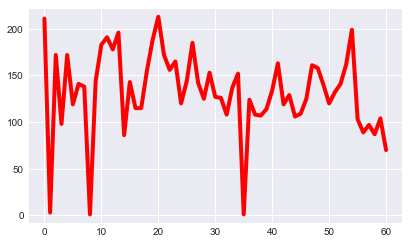

In [25]:
mode_6_data=data[data['click_mode']==6]
import datetime
start_timestamp=np.min(mode_6_data['req_time'])
end_timestamp=np.max(mode_6_data['req_time'])
print(start_timestamp)
print(end_timestamp)

count_list=[]
while start_timestamp<=end_timestamp:
    temp_date=start_timestamp + datetime.timedelta(hours=24)
    print(start_timestamp)
    print(temp_date)    

    print(len(mode_6_data[(mode_6_data['req_time']>=start_timestamp) &  (mode_6_data['req_time']<temp_date)]))
    count_list.append(len(mode_6_data[(mode_6_data['req_time']>start_timestamp) &  (mode_6_data['req_time']<temp_date)]))
    start_timestamp = start_timestamp + datetime.timedelta(hours=24)

plt.plot(range(len(count_list)),count_list,color='red')

In [29]:
# 看看深圳     11-5号，一天的mode分布情况

data[(data['req_time']>=start_timestamp) &  (data['req_time']<temp_date)])